# IEA/IBA Contributions Dashboard

This notebook analyzes **non-redundant IEA annotations** across GO databases. An annotation counts as a "unique contribution" for a GO_REF only if no more specific annotation (lower in the GO hierarchy) exists from another source for the same gene.

- **IEA**: Inferred from Electronic Annotation
- **GO_REF**: Reference identifiers for annotation pipelines (e.g., InterPro2GO, UniRule)
- **Non-redundant**: Annotations not subsumed by more specific annotations from other sources


Note: this notebook was originally for IEA analysis but then extended to include IBA, but method names etc may still say IEA                                   

In [1]:
from itertools import pairwise

import duckdb
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import numpy as np

# Set style for better-looking charts
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (12, 6)

In [2]:
# GO_REF name mappings for better readability
GO_REF_NAMES = {
    'GO_REF:0000002': 'InterPro2GO',
    'GO_REF:0000003': 'EC2GO',
    'GO_REF:0000033': 'PAINT',
    'GO_REF:0000041': 'UniProt UniPathway',
    'GO_REF:0000043': 'UniProt Keywords',
    'GO_REF:0000044': 'UniProt Subcellular',
    'GO_REF:0000104': 'Manual Transfer',
    'GO_REF:0000107': 'Compara',
    'GO_REF:0000108': 'Logical Inference',
    'GO_REF:0000115': 'Rfam',
    'GO_REF:0000116': 'Rhea Mappings',
    'GO_REF:0000117': 'ARBA',
    'GO_REF:0000118': 'TreeGrafter',
    'GO_REF:0000119': 'AGR',
    'GO_REF:0000120': 'Multiple IEA',
}

def get_ref_label(ref):
    """Get human-readable label for GO_REF"""
    if ref in GO_REF_NAMES:
        return f"{ref}\n({GO_REF_NAMES[ref]})"
    return ref

In [3]:
def get_iea_contributions(db_path):
    """
    Query IEA contributions from a database
    
    Args:
        db_path: Path to the DuckDB database file
    
    Returns:
        DataFrame with IEA contribution data
    """
    conn = duckdb.connect(str(db_path), read_only=True)
    
    # Try the summary view first, fall back to manual aggregation if needed
    queries = [
        """
        SELECT 
            evidence_type,
            supporting_references,
            COUNT(*) as "count_star()"
        FROM gaf_unique_reference_contrib 
        WHERE evidence_type IN ('IEA', 'IBA')
        GROUP BY evidence_type, supporting_references
        ORDER BY "count_star()" DESC
        """
    ]
    
    for query in queries:
        try:
            df = conn.execute(query).df()
            conn.close()
            return df
        except Exception as e:
            print(f"Error on {query}:\n{e}")
            continue
    
    print(f"Error querying {db_path}: Could not retrieve IEA contributions")
    conn.close()
    return pd.DataFrame()

In [4]:
def plot_iea_contributions(df, title, ax=None):
    """
    Create a bar chart for IEA contributions
    
    Args:
        df: DataFrame with IEA contribution data
        title: Title for the chart
        ax: Matplotlib axis (optional)
    """
    if df.empty:
        print(f"No data available for {title}")
        return
    
    if ax is None:
        fig, ax = plt.subplots(figsize=(12, 6))
    
    # Add human-readable labels
    df['label'] = df['supporting_references'].apply(get_ref_label)
    
    # Create bar chart
    bars = ax.bar(range(len(df)), df['count_star()'], color='steelblue')
    
    # Customize chart
    ax.set_xlabel('Supporting Reference', fontsize=12)
    ax.set_ylabel('Number of Annotations', fontsize=12)
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xticks(range(len(df)))
    ax.set_xticklabels(df['label'], rotation=45, ha='right')
    
    # Add value labels on bars
    for i, (bar, val) in enumerate(zip(bars, df['count_star()'])):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(df['count_star()'])*0.01,
                f'{val:,}', ha='center', va='bottom', fontsize=10)
    
    # Format y-axis
    ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{int(x):,}'))
    
    plt.tight_layout()
    return ax

## Available Databases

Databases to analyze. Each contains IEA annotations from various GO_REF pipelines.

### Taxonomic Diversity

Number of distinct taxa (species) per database.

In [5]:
# Define database paths and their display names
# Adjust these paths based on your actual database locations
databases = {
    #'Plant': 'db/plant.ddb',
    'Human GOA': 'db/goa_human.ddb',
    'Mouse MGI': 'db/mgi.ddb',
    'Rat RGD': 'db/rgd.ddb',
    'Zebrafish': 'db/zfin.ddb',
    'Fly': 'db/fb.ddb',
    'Worm': 'db/wb.ddb',
    'Yeast': 'db/sgd.ddb',
    'Pombe': 'db/pombase.ddb',
    'Arabidopsis': 'db/tair.ddb',
    'ANOGA': 'db/ANOGA.ddb',  ## Anopheles
    'ZIKV': 'db/ZIKV.ddb',  ## Zika
    'BRADI': 'db/BRADI.ddb',  ## Brachypodium
    'PSEPK': 'db/PSEPK.ddb', ## note: not in GO reference species
    #'Bacteria': 'db/bacteria.ddb', ## TOO LARGE
    'Archaea': 'db/archaea.ddb',
    'Fungi': 'db/fungi.ddb',
    'Virus': 'db/virus.ddb',
    'Clostridium': 'db/clostridium.ddb',
    #'Mammal': 'db/mammal.ddb',
}

# Check which databases exist
base_path = Path('../../')  # Adjust based on notebook location
available_dbs = {}
for name, db_path in databases.items():
    full_path = base_path / db_path
    if full_path.exists():
        available_dbs[name] = full_path
        print(f"✓ Found: {name} ({db_path})")
    else:
        print(f"✗ Not found: {name} ({db_path})")

✓ Found: Human GOA (db/goa_human.ddb)
✓ Found: Mouse MGI (db/mgi.ddb)
✓ Found: Rat RGD (db/rgd.ddb)
✓ Found: Zebrafish (db/zfin.ddb)
✓ Found: Fly (db/fb.ddb)
✓ Found: Worm (db/wb.ddb)
✓ Found: Yeast (db/sgd.ddb)
✓ Found: Pombe (db/pombase.ddb)
✓ Found: Arabidopsis (db/tair.ddb)
✓ Found: ANOGA (db/ANOGA.ddb)
✓ Found: ZIKV (db/ZIKV.ddb)
✓ Found: BRADI (db/BRADI.ddb)
✓ Found: PSEPK (db/PSEPK.ddb)
✓ Found: Archaea (db/archaea.ddb)
✓ Found: Fungi (db/fungi.ddb)
✓ Found: Virus (db/virus.ddb)
✓ Found: Clostridium (db/clostridium.ddb)


In [6]:
# Query distinct taxa from each database
taxa_counts = {}

for name, db_path in available_dbs.items():
    try:
        conn = duckdb.connect(str(db_path), read_only=True)
        
        # Query for distinct NCBITaxon IDs
        query = """
        SELECT COUNT(DISTINCT db_object_taxon) as distinct_taxa
        FROM gaf_association_flat
        WHERE db_object_taxon NOT LIKE '%|%'
        """
        
        result = conn.execute(query).df()
        taxa_count = result['distinct_taxa'].iloc[0] if not result.empty else 0
        taxa_counts[name] = taxa_count
        
        conn.close()
        print(f"{name}: {taxa_count:,} distinct taxa")
    except Exception as e:
        print(f"Error querying {name}: {e}")
        taxa_counts[name] = 0

print(f"\nTotal databases analyzed: {len(taxa_counts)}")

Human GOA: 1 distinct taxa
Mouse MGI: 1 distinct taxa
Rat RGD: 1 distinct taxa
Zebrafish: 1 distinct taxa
Fly: 1 distinct taxa
Worm: 1 distinct taxa
Yeast: 1 distinct taxa
Pombe: 2 distinct taxa
Arabidopsis: 1 distinct taxa
ANOGA: 1 distinct taxa
ZIKV: 1 distinct taxa
BRADI: 1 distinct taxa
PSEPK: 1 distinct taxa
Archaea: 257 distinct taxa
Fungi: 1,131 distinct taxa
Virus: 6,679 distinct taxa
Clostridium: 468 distinct taxa

Total databases analyzed: 17


## Non-Redundant IEA Counts by GO_REF

Bar charts showing the count of non-redundant IEA annotations attributed to each GO_REF pipeline. These are annotations where the pipeline provides the most specific annotation for a gene-term pair.


Analyzing Human GOA...
  Total IEA annotations: 131,833
  Number of GO_REFs: 12


<Figure size 1200x600 with 0 Axes>

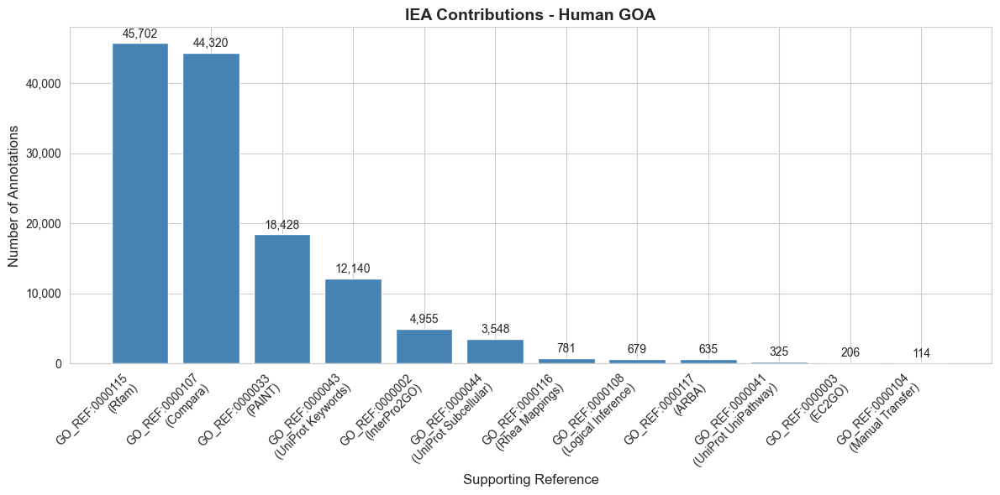


Analyzing Mouse MGI...
  Total IEA annotations: 56,887
  Number of GO_REFs: 12


<Figure size 1200x600 with 0 Axes>

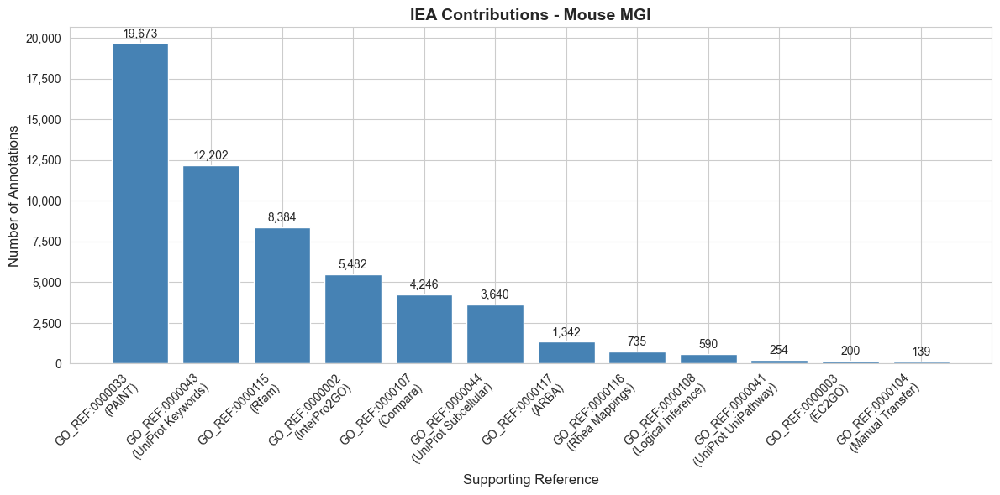


Analyzing Rat RGD...
  Total IEA annotations: 62,303
  Number of GO_REFs: 12


<Figure size 1200x600 with 0 Axes>

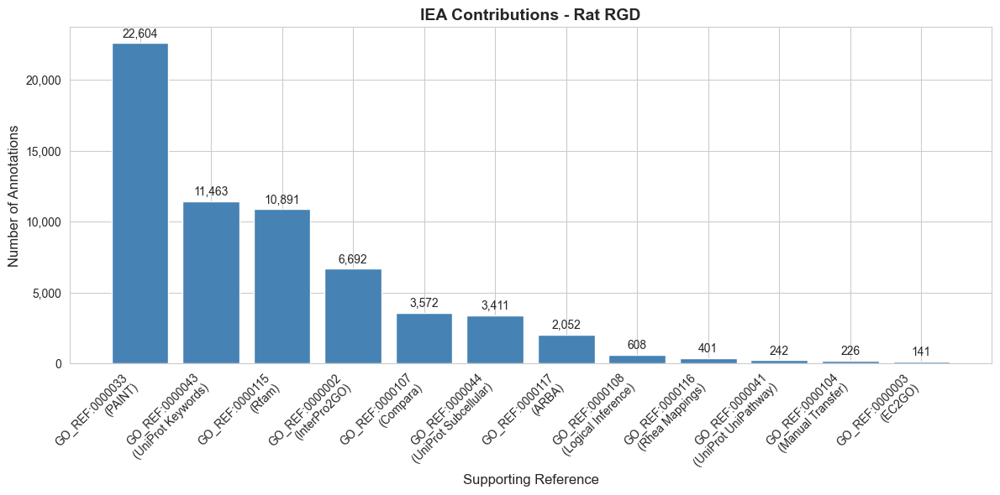


Analyzing Zebrafish...
  Total IEA annotations: 86,932
  Number of GO_REFs: 12


<Figure size 1200x600 with 0 Axes>

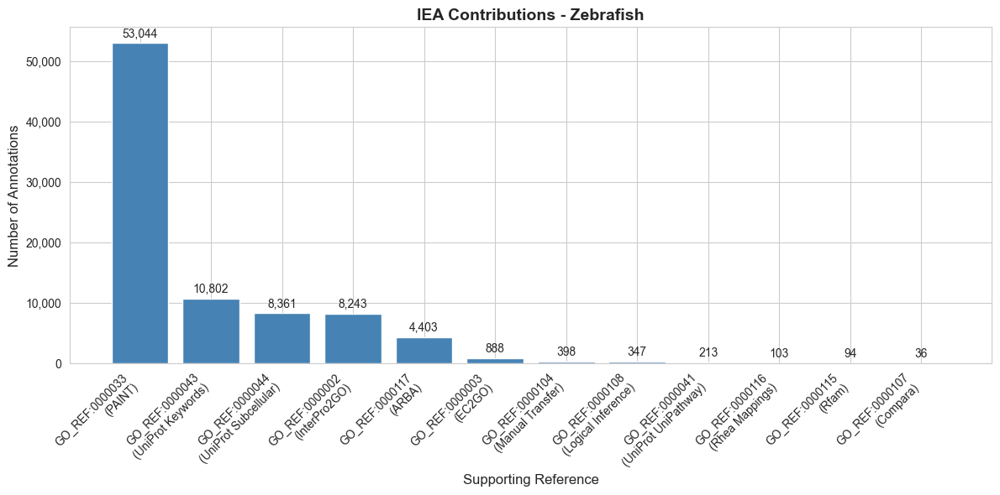


Analyzing Fly...
  Total IEA annotations: 24,983
  Number of GO_REFs: 11


<Figure size 1200x600 with 0 Axes>

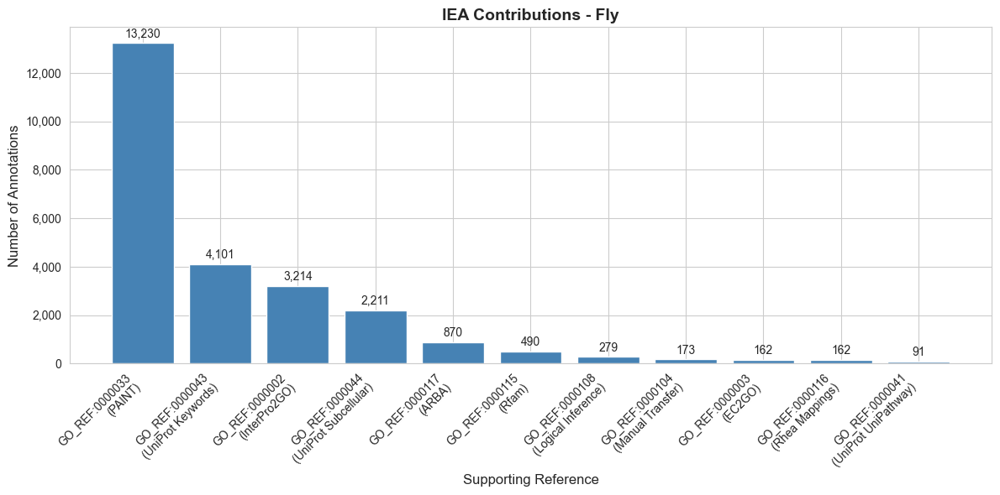


Analyzing Worm...
  Total IEA annotations: 37,045
  Number of GO_REFs: 11


<Figure size 1200x600 with 0 Axes>

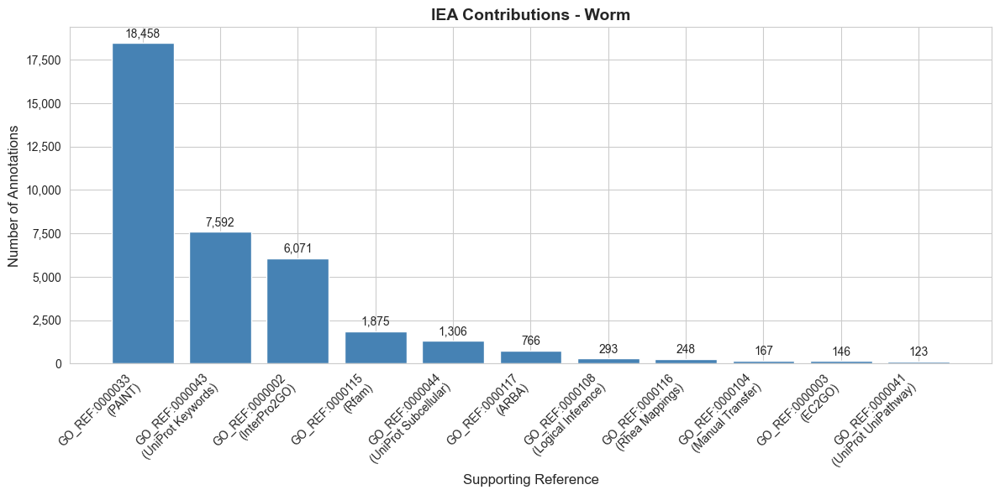


Analyzing Yeast...
  Total IEA annotations: 9,087
  Number of GO_REFs: 11


<Figure size 1200x600 with 0 Axes>

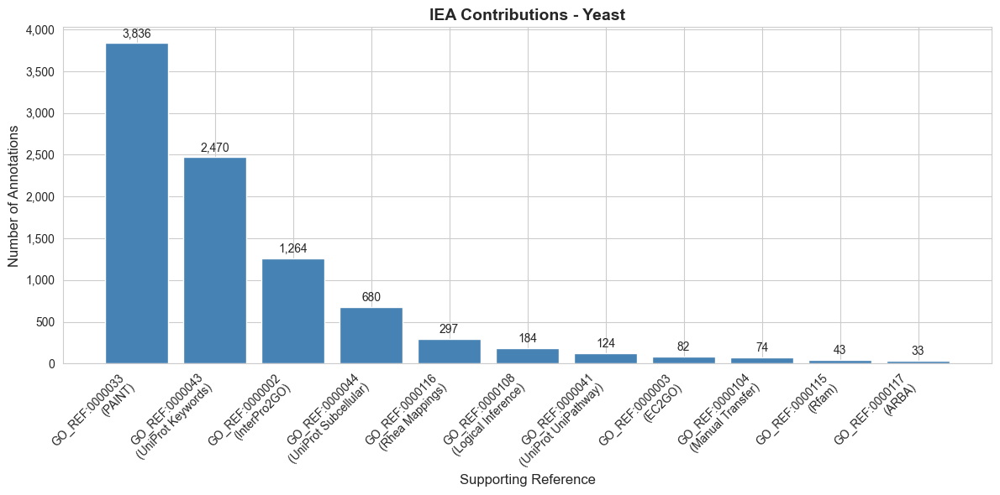


Analyzing Pombe...
  Total IEA annotations: 9,497
  Number of GO_REFs: 11


<Figure size 1200x600 with 0 Axes>

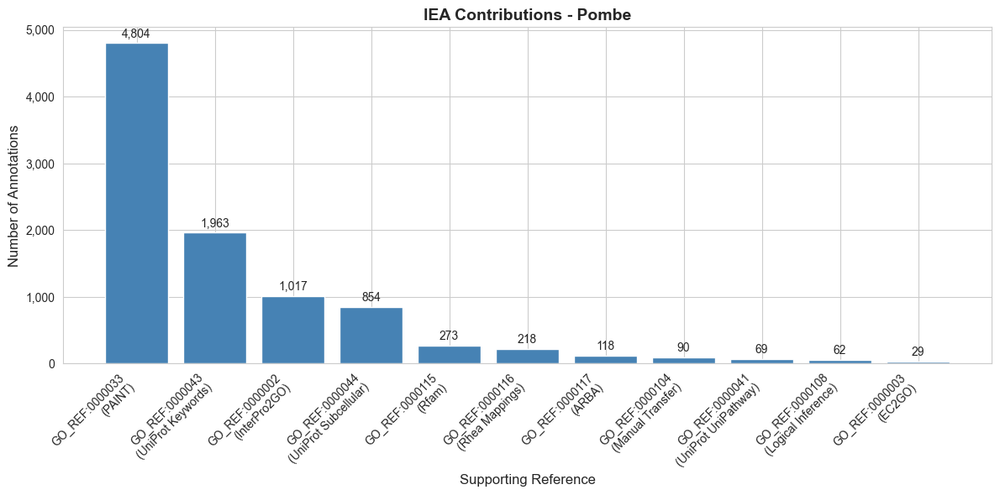


Analyzing Arabidopsis...
  Total IEA annotations: 49,584
  Number of GO_REFs: 4


<Figure size 1200x600 with 0 Axes>

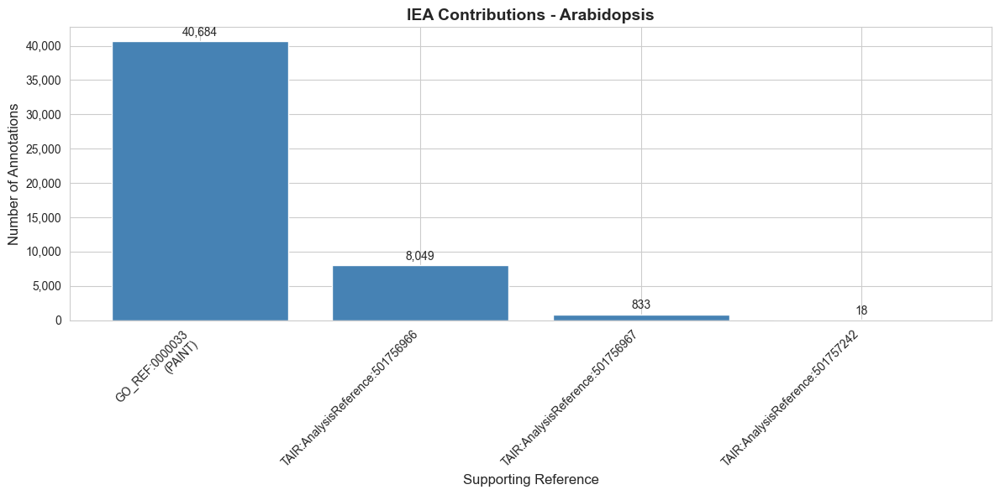


Analyzing ANOGA...
  Total IEA annotations: 35,810
  Number of GO_REFs: 11


<Figure size 1200x600 with 0 Axes>

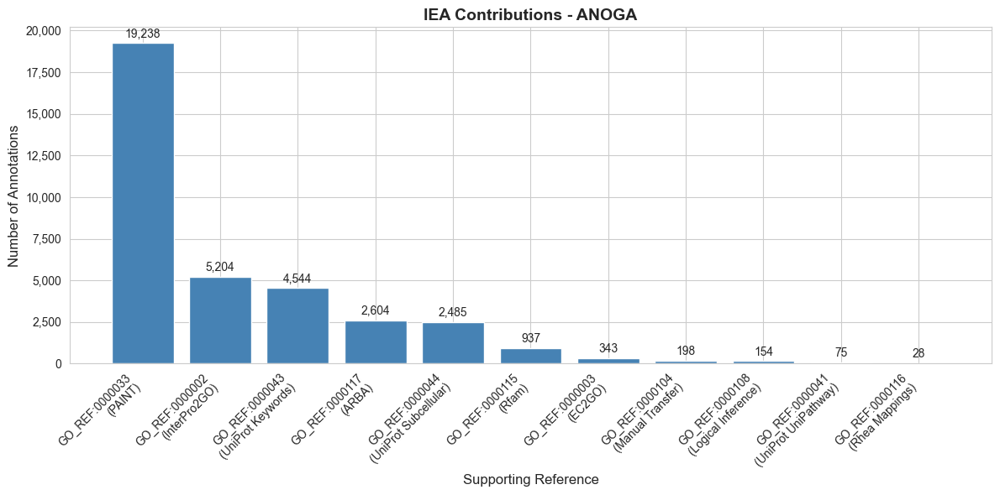


Analyzing ZIKV...
  Total IEA annotations: 34
  Number of GO_REFs: 5


<Figure size 1200x600 with 0 Axes>

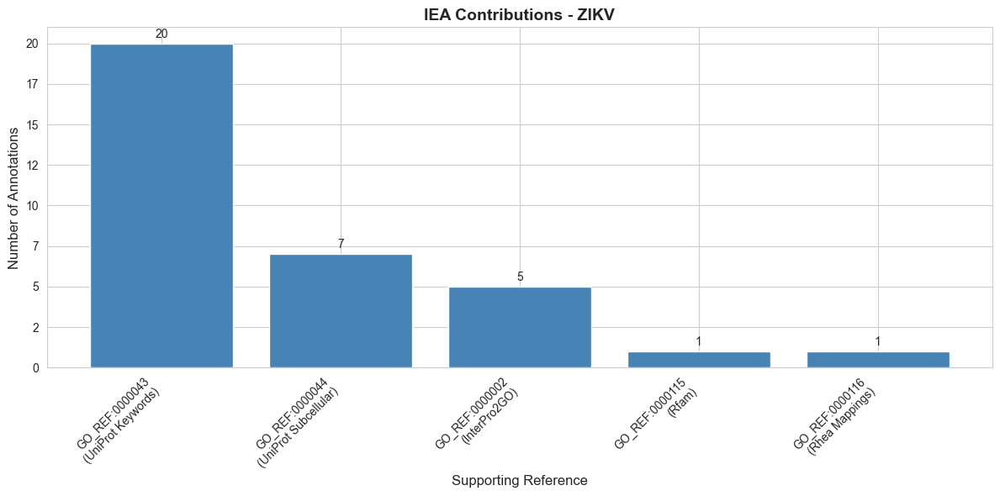


Analyzing BRADI...
  Total IEA annotations: 60,243
  Number of GO_REFs: 11


<Figure size 1200x600 with 0 Axes>

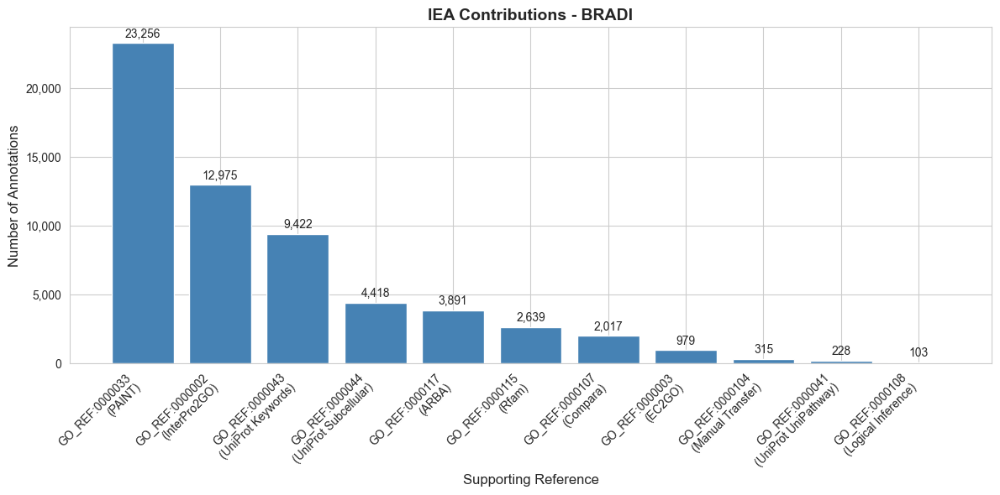


Analyzing PSEPK...
  Total IEA annotations: 9,036
  Number of GO_REFs: 10


<Figure size 1200x600 with 0 Axes>

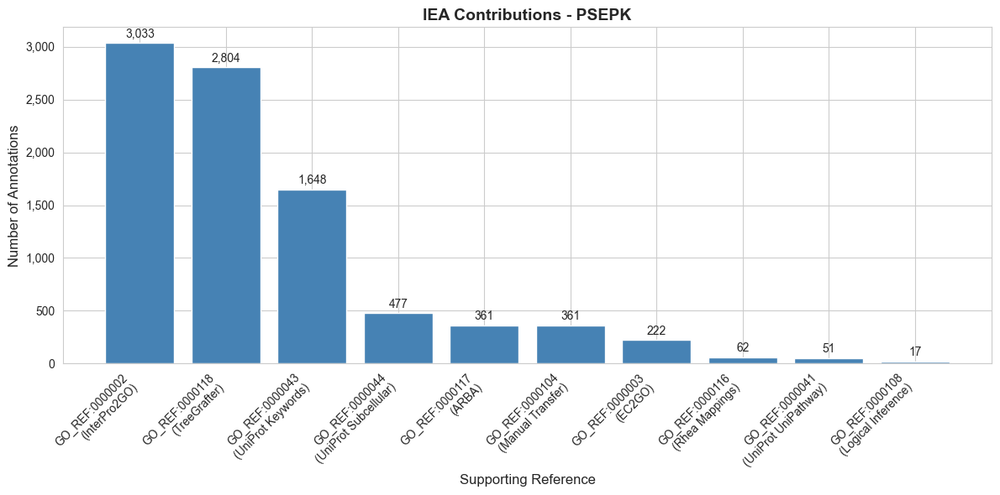


Analyzing Archaea...
  Total IEA annotations: 808,387
  Number of GO_REFs: 11


<Figure size 1200x600 with 0 Axes>

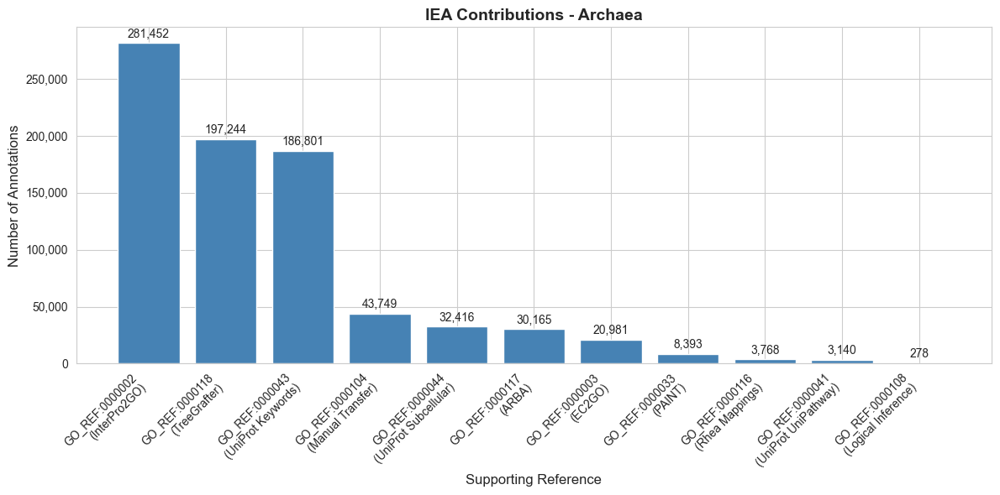


Analyzing Fungi...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

  Total IEA annotations: 21,873,411
  Number of GO_REFs: 12


<Figure size 1200x600 with 0 Axes>

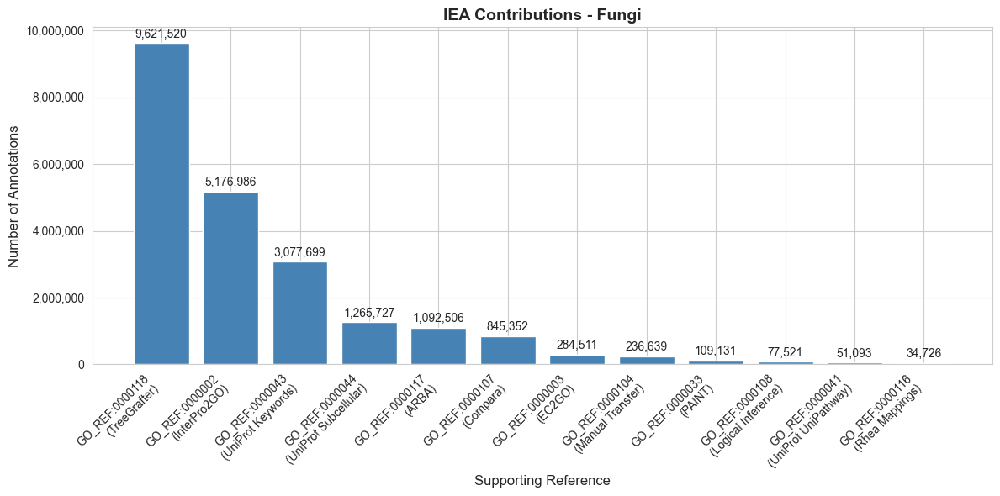


Analyzing Virus...
  Total IEA annotations: 188,204
  Number of GO_REFs: 10


<Figure size 1200x600 with 0 Axes>

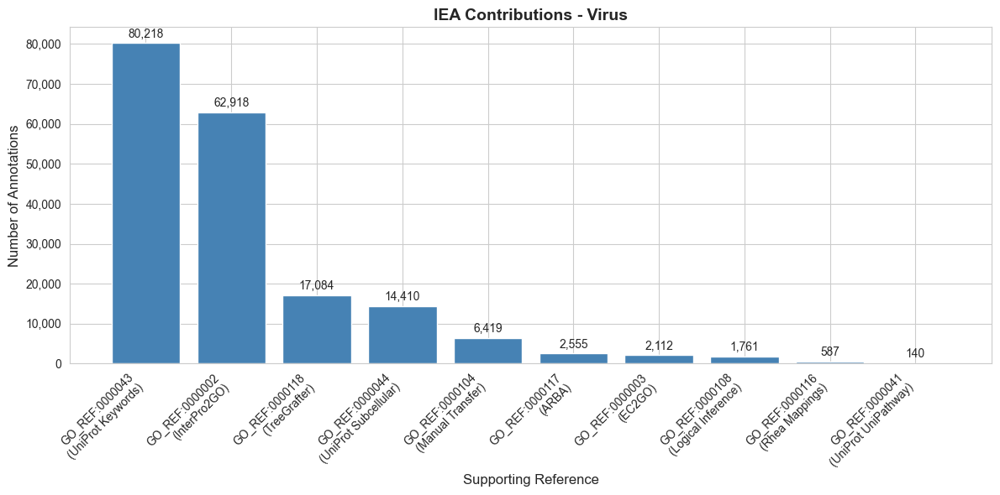


Analyzing Clostridium...
  Total IEA annotations: 2,335,607
  Number of GO_REFs: 11


<Figure size 1200x600 with 0 Axes>

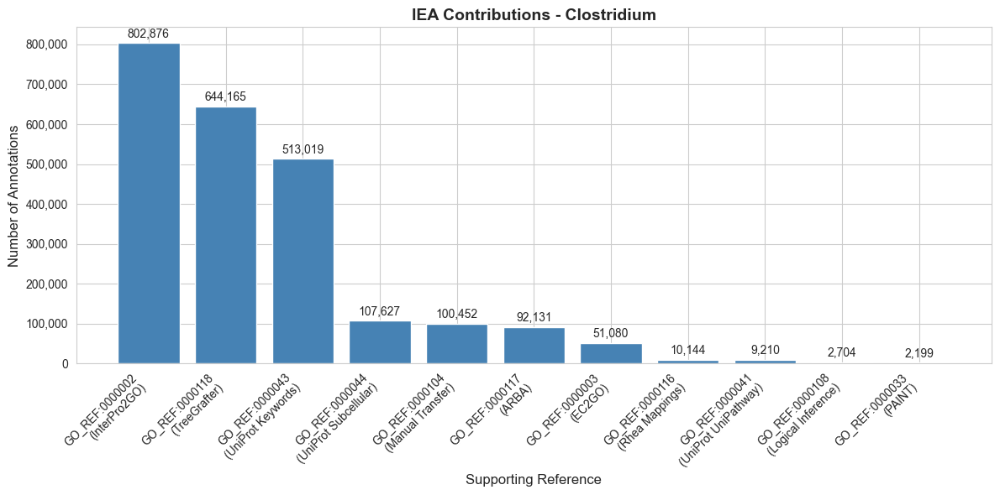

In [7]:
# Analyze each database individually
all_data = {}

for name, db_path in available_dbs.items():
    print(f"\nAnalyzing {name}...")
    df = get_iea_contributions(db_path)
    
    if not df.empty:
        all_data[name] = df
        print(f"  Total IEA annotations: {df['count_star()'].sum():,}")
        print(f"  Number of GO_REFs: {len(df)}")
        
        # Create individual plot
        plt.figure(figsize=(12, 6))
        plot_iea_contributions(df, f'IEA Contributions - {name}')
        plt.show()
    else:
        print(f"  No data available")

## Cross-Database Comparison

Heatmap comparing non-redundant IEA annotation counts by GO_REF across databases.

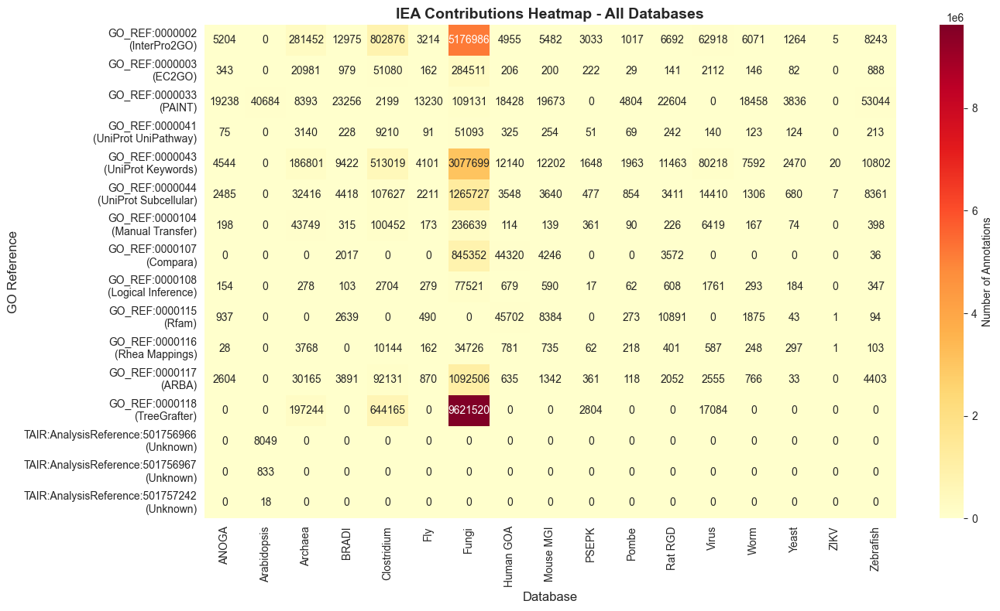

In [8]:
if all_data:
    # Prepare data for comparison
    comparison_data = []
    
    for db_name, df in all_data.items():
        for _, row in df.iterrows():
            comparison_data.append({
                'Database': db_name,
                'GO_REF': row['supporting_references'],
                'Count': row['count_star()']
            })
    
    comparison_df = pd.DataFrame(comparison_data)
    
    # Create pivot table for heatmap
    pivot_df = comparison_df.pivot(index='GO_REF', columns='Database', values='Count').fillna(0)
    
    # Add readable names to index
    pivot_df.index = [f"{ref}\n({GO_REF_NAMES.get(ref, 'Unknown')})" for ref in pivot_df.index]
    
    # Create heatmap
    plt.figure(figsize=(14, 8))
    sns.heatmap(pivot_df, annot=True, fmt='.0f', cmap='YlOrRd', 
                cbar_kws={'label': 'Number of Annotations'})
    plt.title('IEA Contributions Heatmap - All Databases', fontsize=14, fontweight='bold')
    plt.xlabel('Database', fontsize=12)
    plt.ylabel('GO Reference', fontsize=12)
    plt.tight_layout()
    plt.show()

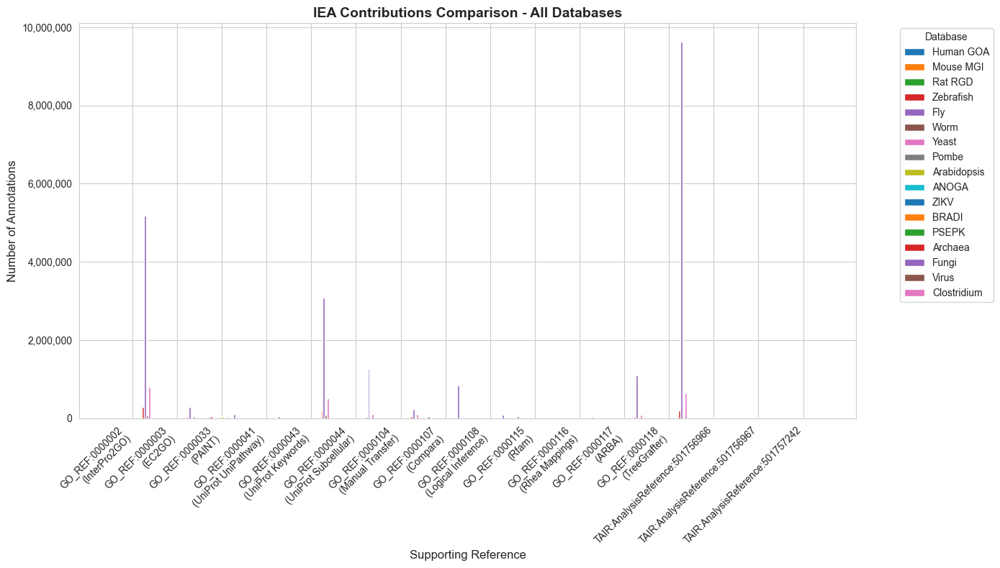

In [9]:
if all_data:
    # Stacked bar chart comparison
    fig, ax = plt.subplots(figsize=(14, 8))
    
    # Get unique GO_REFs across all databases
    all_refs = set()
    for df in all_data.values():
        all_refs.update(df['supporting_references'].values)
    all_refs = sorted(all_refs)
    
    # Prepare data for stacked bars
    bar_width = 0.8 / len(all_data)
    x = np.arange(len(all_refs))
    
    for i, (db_name, df) in enumerate(all_data.items()):
        values = []
        for ref in all_refs:
            val = df[df['supporting_references'] == ref]['count_star()'].values
            values.append(val[0] if len(val) > 0 else 0)
        
        ax.bar(x + i * bar_width, values, bar_width, label=db_name)
    
    # Customize chart
    ax.set_xlabel('Supporting Reference', fontsize=12)
    ax.set_ylabel('Number of Annotations', fontsize=12)
    ax.set_title('IEA Contributions Comparison - All Databases', fontsize=14, fontweight='bold')
    ax.set_xticks(x + bar_width * (len(all_data) - 1) / 2)
    ax.set_xticklabels([get_ref_label(ref) for ref in all_refs], rotation=45, ha='right')
    ax.legend(title='Database', bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{int(x):,}'))
    
    plt.tight_layout()
    plt.show()

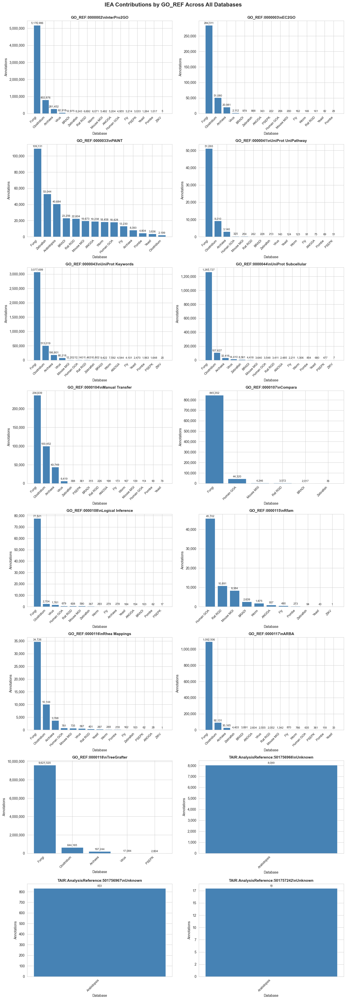

In [10]:
if all_data:
    # Get all unique GO_REFs across all databases
    all_refs = set()
    for df in all_data.values():
        all_refs.update(df['supporting_references'].values)
    all_refs = sorted(all_refs)
    
    # Determine grid layout
    n_refs = len(all_refs)
    n_cols = 2  # Two columns for better readability
    n_rows = (n_refs + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 5*n_rows))
    
    # Flatten axes for easier iteration
    if n_refs == 1:
        axes = [axes]
    else:
        axes = axes.flatten()
    
    # Create a bar chart for each GO_REF
    for idx, ref in enumerate(all_refs):
        ax = axes[idx]
        
        # Collect data for this GO_REF across all databases
        ref_data = []
        for db_name, df in all_data.items():
            val = df[df['supporting_references'] == ref]['count_star()'].values
            count = val[0] if len(val) > 0 else 0
            if count > 0:  # Only include databases with data for this GO_REF
                ref_data.append({'Database': db_name, 'Count': count})
        
        if ref_data:
            ref_df = pd.DataFrame(ref_data).sort_values('Count', ascending=False)
            
            # Create bar chart
            bars = ax.bar(range(len(ref_df)), ref_df['Count'], color='steelblue')
            
            # Customize chart
            ref_name = GO_REF_NAMES.get(ref, 'Unknown')
            ax.set_title(f'{ref}\\n{ref_name}', fontsize=11, fontweight='bold')
            ax.set_xlabel('Database', fontsize=10)
            ax.set_ylabel('Annotations', fontsize=10)
            ax.set_xticks(range(len(ref_df)))
            ax.set_xticklabels(ref_df['Database'], rotation=45, ha='right', fontsize=9)
            
            # Add value labels on bars
            for bar, val in zip(bars, ref_df['Count']):
                height = bar.get_height()
                ax.text(bar.get_x() + bar.get_width()/2, height + max(ref_df['Count'])*0.01,
                       f'{val:,.0f}', ha='center', va='bottom', fontsize=8)
            
            # Format y-axis
            ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{int(x):,}'))
            
            # Set y-axis to start at 0
            ax.set_ylim(bottom=0)
        else:
            ax.text(0.5, 0.5, 'No data', ha='center', va='center', transform=ax.transAxes)
            ax.set_title(f'{ref}\\n{GO_REF_NAMES.get(ref, "Unknown")}', fontsize=11, fontweight='bold')
            ax.set_xticks([])
            ax.set_yticks([])
    
    # Hide empty subplots
    for idx in range(n_refs, len(axes)):
        axes[idx].axis('off')
    
    plt.suptitle('IEA Contributions by GO_REF Across All Databases', 
                 fontsize=16, fontweight='bold', y=1.001)
    plt.tight_layout()
    plt.show()

## Per-GO_REF Breakdown

Non-redundant IEA annotation counts for each GO_REF, split by database.

## Summary Statistics

Total non-redundant IEA annotations by database and GO_REF.

In [11]:
if all_data:
    # Create summary table
    summary_data = []
    
    for db_name, df in all_data.items():
        total = df['count_star()'].sum()
        top_ref = df.iloc[0]['supporting_references'] if not df.empty else 'N/A'
        top_count = df.iloc[0]['count_star()'] if not df.empty else 0
        
        summary_data.append({
            'Database': db_name,
            'Total IEA Annotations': f"{total:,}",
            'Number of GO_REFs': len(df),
            'Top GO_REF': GO_REF_NAMES.get(top_ref, top_ref),
            'Top GO_REF Count': f"{top_count:,}",
            'Top GO_REF %': f"{(top_count/total*100):.1f}%" if total > 0 else '0%'
        })
    
    summary_df = pd.DataFrame(summary_data)
    summary_df = summary_df.sort_values('Database')
    
    print("\n" + "="*80)
    print("SUMMARY OF IEA CONTRIBUTIONS ACROSS DATABASES")
    print("="*80)
    display(summary_df)


SUMMARY OF IEA CONTRIBUTIONS ACROSS DATABASES


,Database,Total IEA Annotations,Number of GO_REFs,Top GO_REF,Top GO_REF Count,Top GO_REF %
9,ANOGA,"35,810",11,PAINT,"19,238",53.7%
8,Arabidopsis,"49,584",4,PAINT,"40,684",82.1%
13,Archaea,"808,387",11,InterPro2GO,"281,452",34.8%
11,BRADI,"60,243",11,PAINT,"23,256",38.6%
16,Clostridium,"2,335,607",11,InterPro2GO,"802,876",34.4%
4,Fly,"24,983",11,PAINT,"13,230",53.0%
14,Fungi,"21,873,411",12,TreeGrafter,"9,621,520",44.0%
0,Human GOA,"131,833",12,Rfam,"45,702",34.7%
1,Mouse MGI,"56,887",12,PAINT,"19,673",34.6%
12,PSEPK,"9,036",10,InterPro2GO,"3,033",33.6%


## Distribution Analysis

Pie charts showing the proportion of non-redundant IEAs contributed by each GO_REF pipeline.

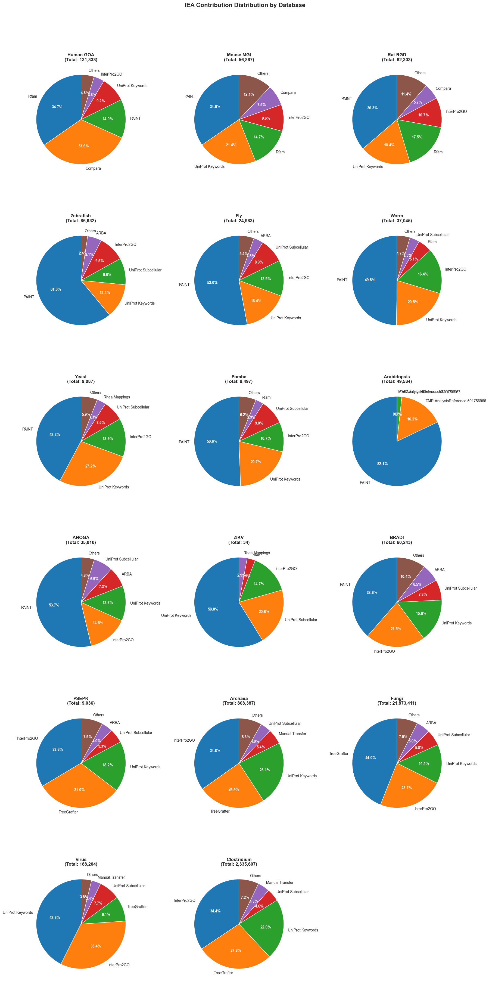

In [12]:
if all_data:
    # Pie charts for top databases
    n_databases = len(all_data)
    n_cols = min(3, n_databases)
    n_rows = (n_databases + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 6*n_rows))
    if n_databases == 1:
        axes = [axes]
    elif n_rows == 1:
        axes = axes.reshape(1, -1)
    
    for idx, (db_name, df) in enumerate(all_data.items()):
        row = idx // n_cols
        col = idx % n_cols
        
        if n_rows == 1:
            ax = axes[col]
        else:
            ax = axes[row, col]
        
        if not df.empty:
            # Take top 5 and group others
            top_n = 5
            if len(df) > top_n:
                top_df = df.head(top_n).copy()
                others_sum = df.iloc[top_n:]['count_star()'].sum()
                if others_sum > 0:
                    others_row = pd.DataFrame({
                        'supporting_references': ['Others'],
                        'count_star()': [others_sum]
                    })
                    plot_df = pd.concat([top_df, others_row], ignore_index=True)
                else:
                    plot_df = top_df
            else:
                plot_df = df.copy()
            
            # Create labels
            labels = [GO_REF_NAMES.get(ref, ref) if ref != 'Others' else 'Others' 
                     for ref in plot_df['supporting_references']]
            
            # Create pie chart
            wedges, texts, autotexts = ax.pie(plot_df['count_star()'], 
                                               labels=labels,
                                               autopct='%1.1f%%',
                                               startangle=90)
            ax.set_title(f'{db_name}\n(Total: {df["count_star()"].sum():,})', 
                        fontsize=12, fontweight='bold')
            
            # Improve text readability
            for autotext in autotexts:
                autotext.set_color('white')
                autotext.set_fontsize(10)
                autotext.set_fontweight('bold')
    
    # Hide empty subplots
    for idx in range(n_databases, n_rows * n_cols):
        row = idx // n_cols
        col = idx % n_cols
        if n_rows == 1:
            axes[col].axis('off')
        else:
            axes[row, col].axis('off')
    
    plt.suptitle('IEA Contribution Distribution by Database', 
                 fontsize=16, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

## Export Data

Export aggregated non-redundant IEA counts to CSV.

In [13]:
if all_data:
    # Export individual database data
    export_dir = Path('iea_contributions_export')
    export_dir.mkdir(exist_ok=True)
    
    for db_name, df in all_data.items():
        # Add readable names column
        export_df = df.copy()
        export_df['reference_name'] = export_df['supporting_references'].apply(
            lambda x: GO_REF_NAMES.get(x, 'Unknown')
        )
        
        # Save to CSV
        filename = export_dir / f"iea_{db_name.lower().replace(' ', '_')}.csv"
        export_df.to_csv(filename, index=False)
        print(f"Exported {db_name} to {filename}")
    
    # Export comparison data
    if 'comparison_df' in locals():
        comparison_filename = export_dir / "iea_all_databases_comparison.csv"
        comparison_df.to_csv(comparison_filename, index=False)
        print(f"\nExported comparison data to {comparison_filename}")
    
    print(f"\nAll data exported to {export_dir}/")

Exported Human GOA to iea_contributions_export/iea_human_goa.csv
Exported Mouse MGI to iea_contributions_export/iea_mouse_mgi.csv
Exported Rat RGD to iea_contributions_export/iea_rat_rgd.csv
Exported Zebrafish to iea_contributions_export/iea_zebrafish.csv
Exported Fly to iea_contributions_export/iea_fly.csv
Exported Worm to iea_contributions_export/iea_worm.csv
Exported Yeast to iea_contributions_export/iea_yeast.csv
Exported Pombe to iea_contributions_export/iea_pombe.csv
Exported Arabidopsis to iea_contributions_export/iea_arabidopsis.csv
Exported ANOGA to iea_contributions_export/iea_anoga.csv
Exported ZIKV to iea_contributions_export/iea_zikv.csv
Exported BRADI to iea_contributions_export/iea_bradi.csv
Exported PSEPK to iea_contributions_export/iea_psepk.csv
Exported Archaea to iea_contributions_export/iea_archaea.csv
Exported Fungi to iea_contributions_export/iea_fungi.csv
Exported Virus to iea_contributions_export/iea_virus.csv
Exported Clostridium to iea_contributions_export/iea

## Pairwise GO_REF Analysis

Compares pairs of GO_REFs: for each pair, counts annotations that are unique to one reference relative to the other. This identifies which methods provide annotations that aren't covered (at the same or more specific level) by another method.

In [14]:
def get_pairwise_goref_analysis(db_path, species_name):
    """
    Query pairwise GO_REF combinations from the database
    
    Args:
        db_path: Path to the DuckDB database file
        species_name: Name of the species/database for display
    
    Returns:
        DataFrame with pairwise GO_REF data
    """
    conn = duckdb.connect(str(db_path), read_only=True)
    
    combined_df = pd.DataFrame()
    for uref_id in GO_REF_NAMES.keys():
        for cref_id in GO_REF_NAMES.keys():
            # print(f"Querying {species_name}: {uref_id} & {cref_id}")
            
    
            query = f"""
            SELECT 
                evidence_type,
                unique_ref_id,
                unique_ref_title,
                comparator_ref_id,
                comparator_ref_title,
                association_count
            FROM pairwise_gaf_unique_reference_contrib_summary
            WHERE evidence_type = 'IEA'
                AND unique_ref_id = '{uref_id}'
                AND comparator_ref_id = '{cref_id}'
            """
    
            df = conn.execute(query).df()
            if not df.empty:
                combined_df = pd.concat([combined_df, df], ignore_index=True)
    conn.close()
    return combined_df

In [15]:
# Define subset of species to analyze (starting with human)
species_to_analyze = {
    'Virus': available_dbs.get('Virus'),
    #'Archaea': available_dbs.get('Archaea'),
    'Human': available_dbs.get('Human GOA'),
    'Mouse': available_dbs.get('Mouse MGI'),
    'Rat': available_dbs.get('Rat RGD'),
    'Worm': available_dbs.get('Worm'),
    'Fly': available_dbs.get('Fly'),
    'Clostridium': available_dbs.get('Clostridium'),
    #'Yeast': available_dbs.get('Yeast'),
    #'Pseudomonadota': available_dbs.get('Pseudomonadota'),
    #'Plant': available_dbs.get('Plant'),
    #'Fungi': available_dbs.get('Fungi'),
    

}

# Remove None values
species_to_analyze = {k: v for k, v in species_to_analyze.items() if v is not None}

print("Analyzing pairwise GO_REF combinations for:")
for species in species_to_analyze.keys():
    print(f"  - {species}")

Analyzing pairwise GO_REF combinations for:
  - Virus
  - Human
  - Mouse
  - Rat
  - Worm
  - Fly
  - Clostridium


In [16]:
# Collect pairwise data for each species
pairwise_data = {}

for species_name, db_path in species_to_analyze.items():
    print(f"\nAnalyzing {species_name}...")
    df = get_pairwise_goref_analysis(db_path, species_name)
    
    if not df.empty:
        pairwise_data[species_name] = df
        print(f"  Found {len(df)} pairwise GO_REF combinations")
        print(f"  Total pairwise associations: {df['association_count'].sum():,}")
        
        # Show top 10 combinations
        print(f"\n  Top 10 GO_REF combinations for {species_name}:")
        for idx, row in df.head(10).iterrows():
            print(f"    {row['unique_ref_id']} ({row['unique_ref_title']}) & "
                  f"{row['comparator_ref_id']} ({row['comparator_ref_title']}): "
                  f"{row['association_count']:,} associations")
    else:
        print(f"  No pairwise data available")


Analyzing Virus...
  Found 90 pairwise GO_REF combinations
  Total pairwise associations: 3,371,164

  Top 10 GO_REF combinations for Virus:
    GO_REF:0000002 (Gene Ontology annotation through association of InterPro records with GO terms.) & GO_REF:0000003 (Gene Ontology annotation based on Enzyme Commission mapping): 112,378 associations
    GO_REF:0000002 (Gene Ontology annotation through association of InterPro records with GO terms.) & GO_REF:0000041 (Gene Ontology annotation based on UniPathway vocabulary mapping.): 123,983 associations
    GO_REF:0000002 (Gene Ontology annotation through association of InterPro records with GO terms.) & GO_REF:0000043 (Gene Ontology annotation based on UniProtKB/Swiss-Prot keyword mapping): 85,171 associations
    GO_REF:0000002 (Gene Ontology annotation through association of InterPro records with GO terms.) & GO_REF:0000044 (Gene Ontology annotation based on UniProtKB/Swiss-Prot Subcellular Location vocabulary mapping, accompanied by conserv


Processing Virus...


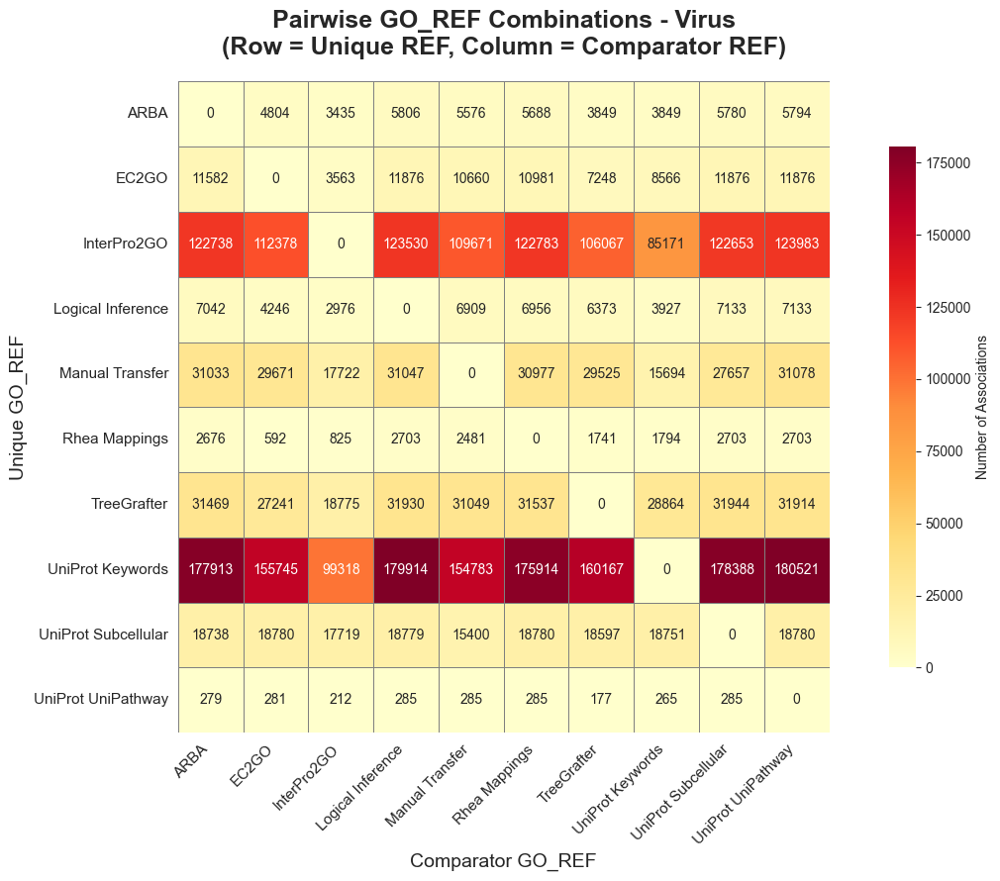

Heatmap for Virus: 10x10 matrix (asymmetric)

Processing Human...


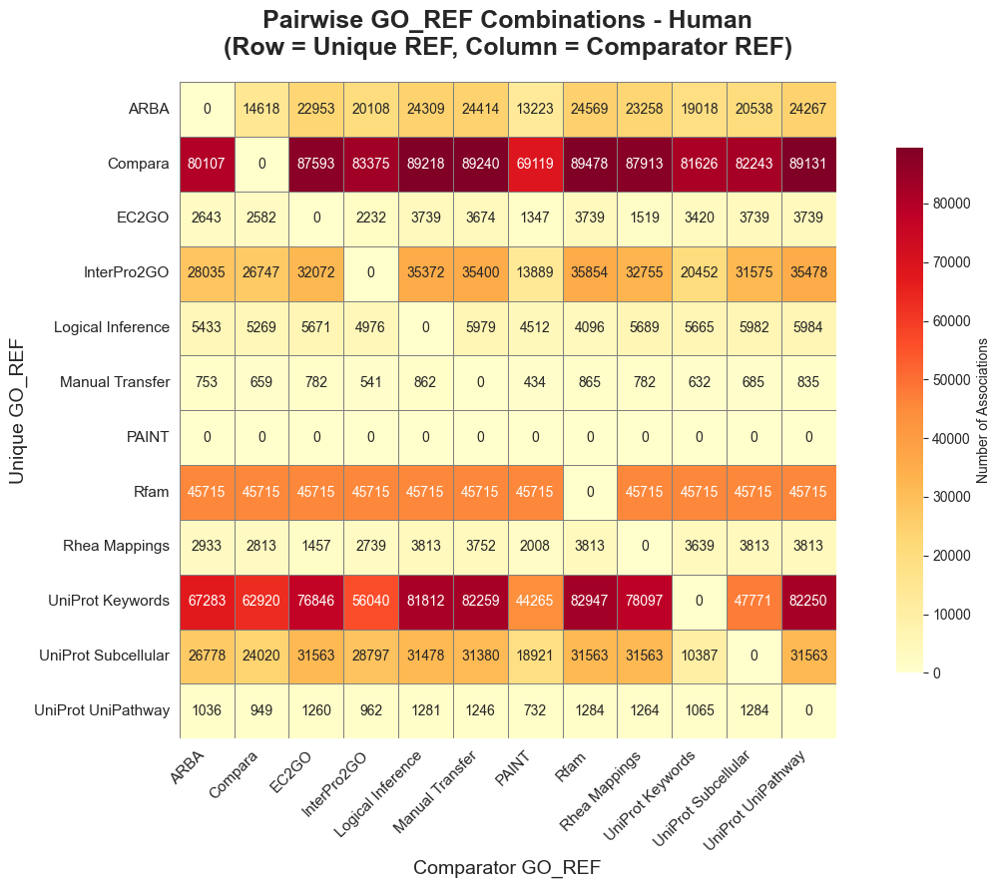

Heatmap for Human: 12x12 matrix (asymmetric)

Processing Mouse...


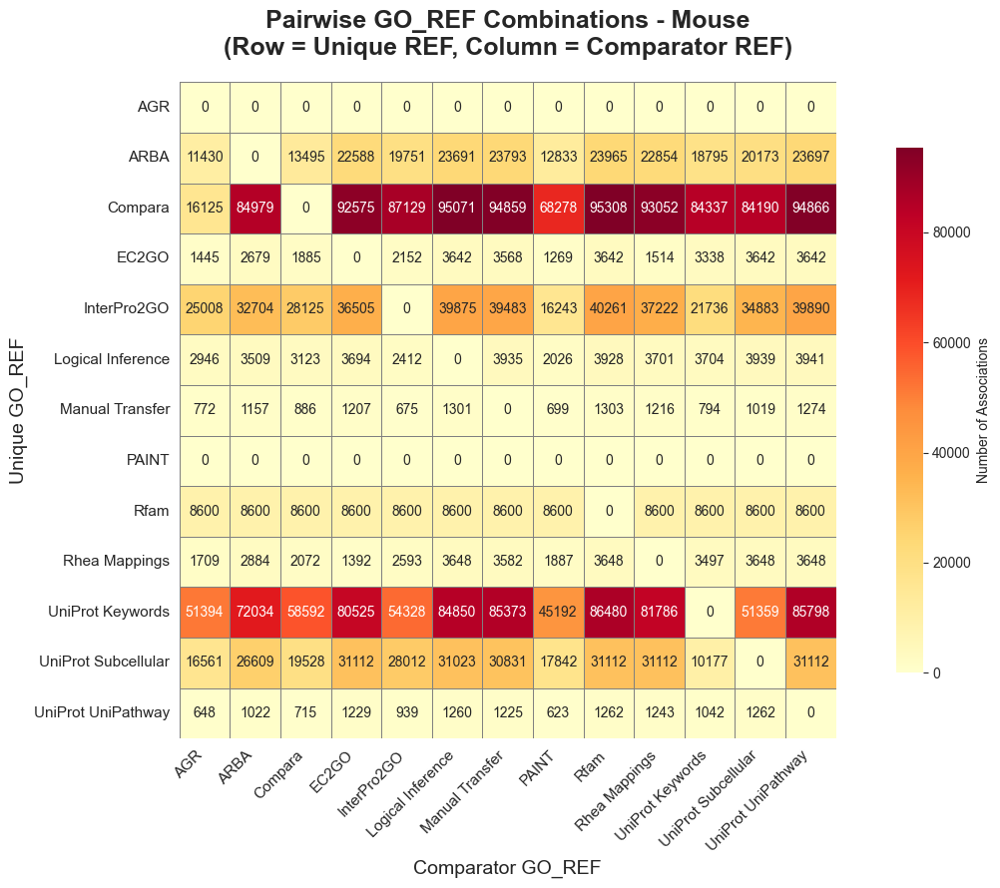

Heatmap for Mouse: 13x13 matrix (asymmetric)

Processing Rat...


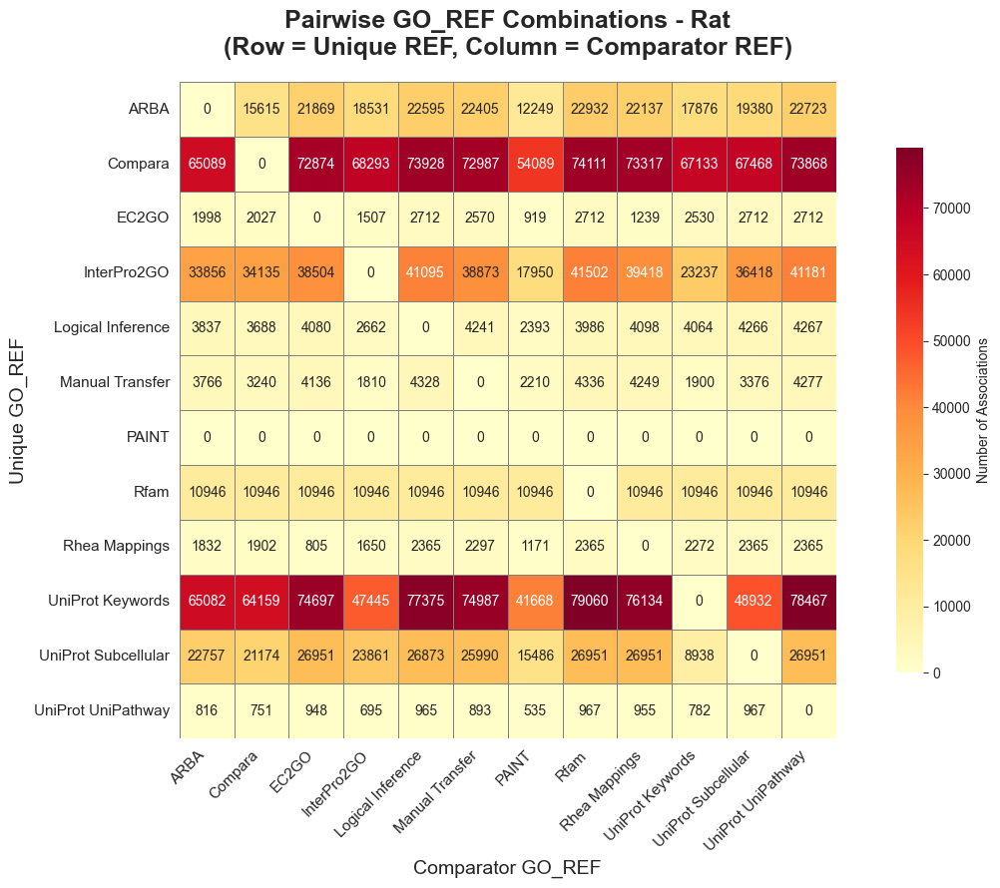

Heatmap for Rat: 12x12 matrix (asymmetric)

Processing Worm...


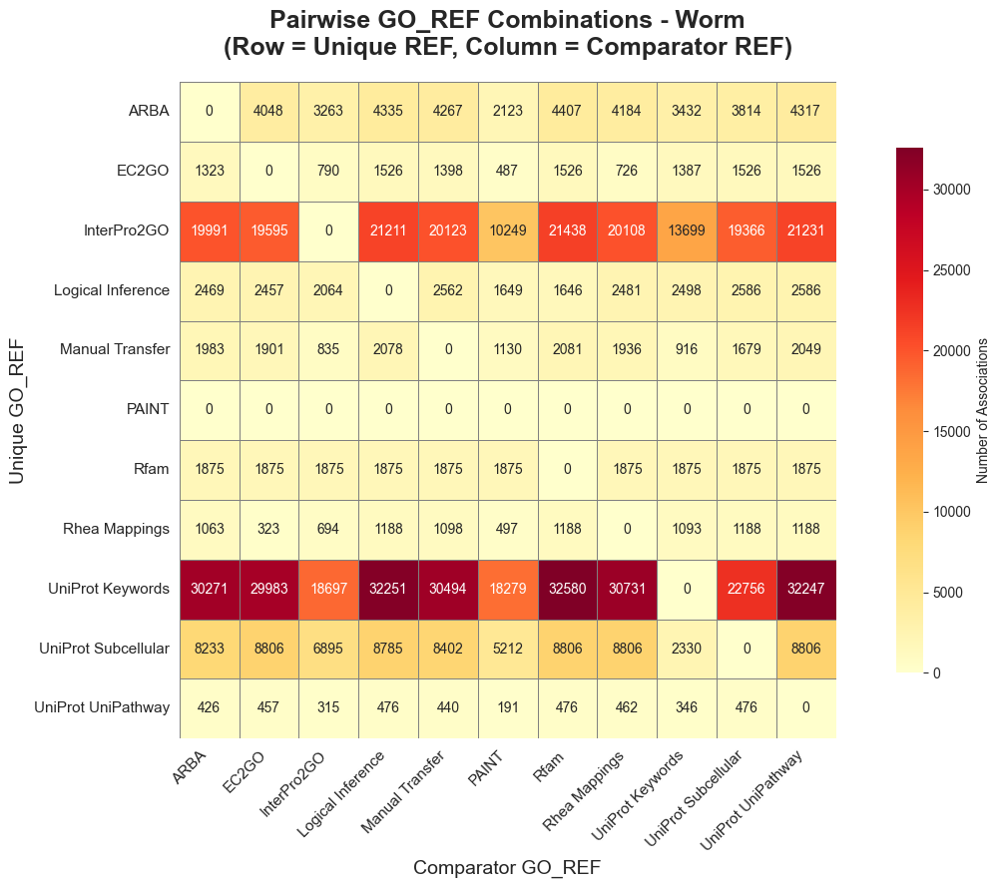

Heatmap for Worm: 11x11 matrix (asymmetric)

Processing Fly...


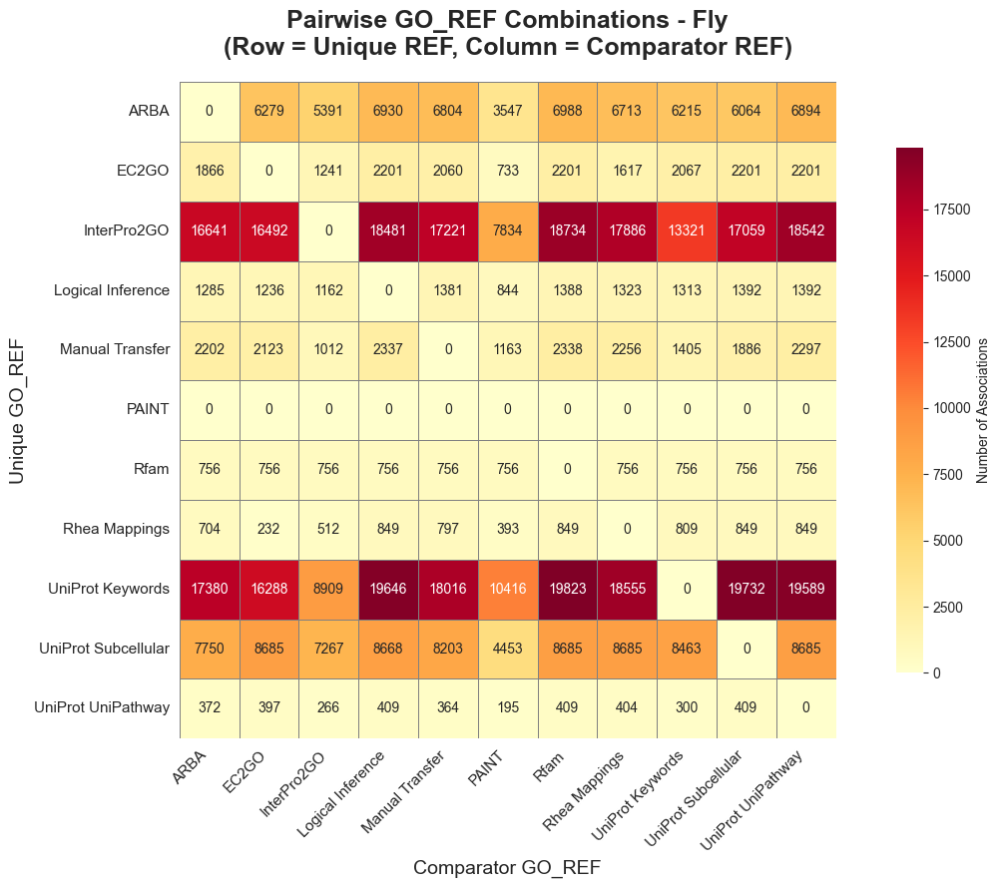

Heatmap for Fly: 11x11 matrix (asymmetric)

Processing Clostridium...


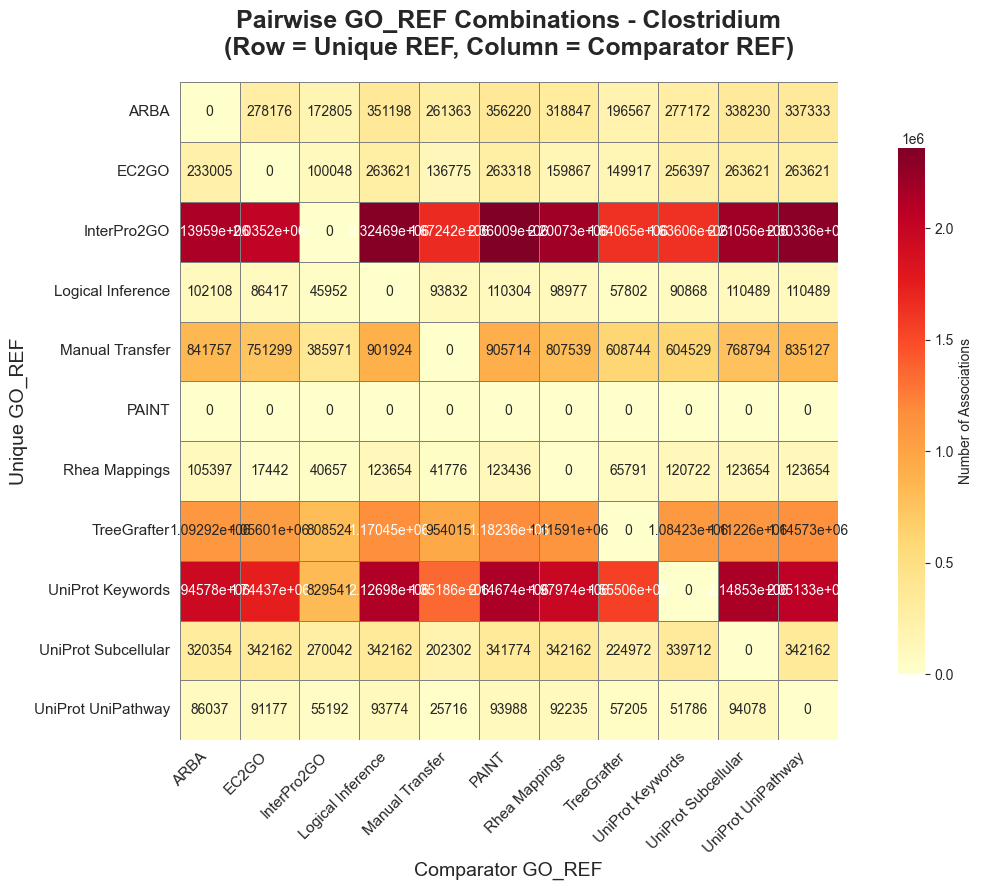

Heatmap for Clostridium: 11x11 matrix (asymmetric)


In [17]:
# Visualize pairwise GO_REF combinations as network-style heatmaps
if pairwise_data:
    for species_name, df in pairwise_data.items():
        print(f"\nProcessing {species_name}...")
        if df.empty:
            continue
        
        # Filter to only include GO_REFs that are in our dictionary
        df_filtered = df[
            (df['unique_ref_id'].isin(GO_REF_NAMES.keys())) & 
            (df['comparator_ref_id'].isin(GO_REF_NAMES.keys()))
        ].copy()
        
        if df_filtered.empty:
            print(f"No known GO_REFs found for {species_name}")
            continue
            
        # Use short labels from GO_REF_NAMES dictionary
        df_filtered['unique_ref'] = df_filtered['unique_ref_id'].apply(lambda x: GO_REF_NAMES.get(x, x))
        df_filtered['comparator_ref'] = df_filtered['comparator_ref_id'].apply(lambda x: GO_REF_NAMES.get(x, x))
        
        # Get all unique GO_REF labels involved
        all_refs = sorted(set(df_filtered['unique_ref'].unique()) | set(df_filtered['comparator_ref'].unique()))
        
        # Create a square matrix with all refs on both axes
        matrix = pd.DataFrame(0, index=all_refs, columns=all_refs)
        
        # Fill in the values from the data - DO NOT make it symmetric!
        # Each row represents unique_ref, each column represents comparator_ref
        for _, row in df_filtered.iterrows():
            matrix.loc[row['unique_ref'], row['comparator_ref']] = row['association_count']
        
        # The diagonal should naturally be zero (a GO_REF compared with itself)
        # but let's ensure it
        np.fill_diagonal(matrix.values, 0)
        
        # Create much larger heatmap
        plt.figure(figsize=(13, 9))
        sns.heatmap(matrix, 
                    annot=True, 
                    fmt='g',
                    cmap='YlOrRd',
                    cbar_kws={'label': 'Number of Associations', 'shrink': 0.8},
                    square=True,
                    linewidths=0.5,
                    linecolor='gray',
                    vmin=0)
        
        plt.title(f'Pairwise GO_REF Combinations - {species_name}\n(Row = Unique REF, Column = Comparator REF)', 
                 fontsize=18, fontweight='bold', pad=20)
        plt.xlabel('Comparator GO_REF', fontsize=14)
        plt.ylabel('Unique GO_REF', fontsize=14)
        plt.xticks(rotation=45, ha='right', fontsize=11)
        plt.yticks(rotation=0, fontsize=11)
        plt.tight_layout()
        plt.show()
        
        print(f"Heatmap for {species_name}: {len(all_refs)}x{len(all_refs)} matrix (asymmetric)")

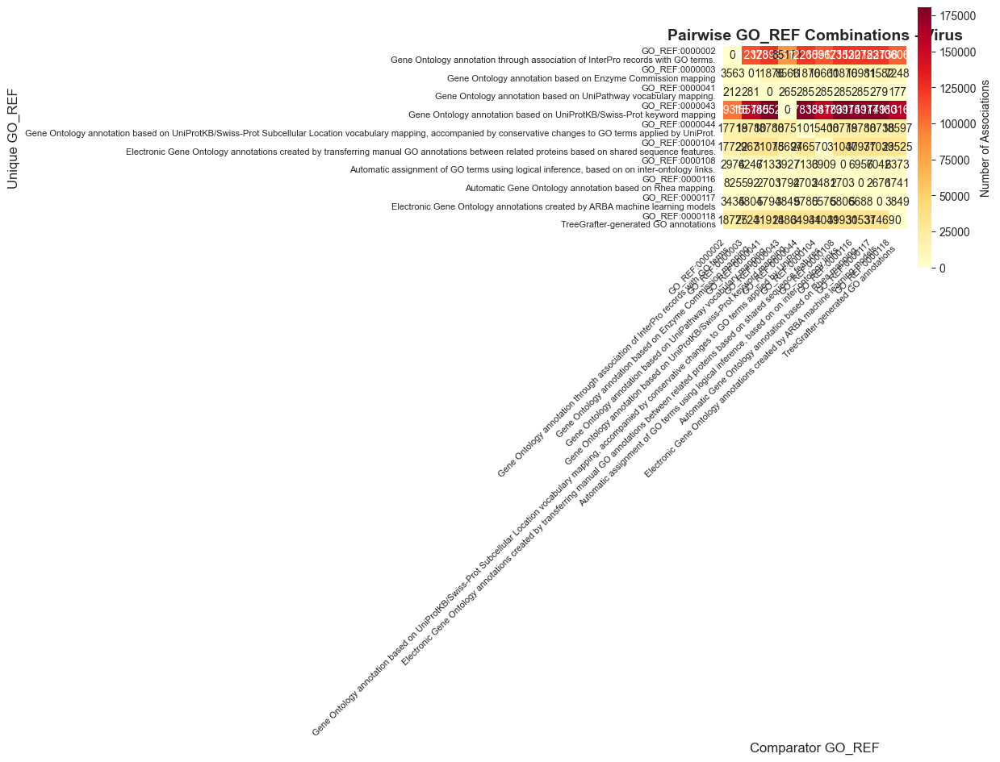

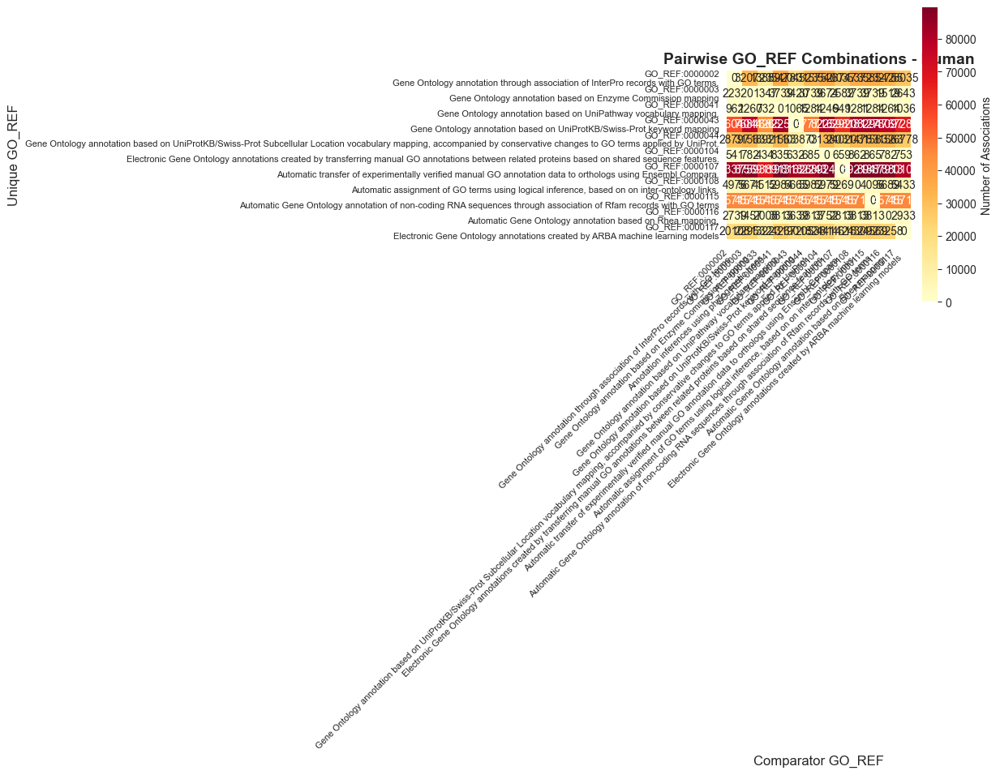

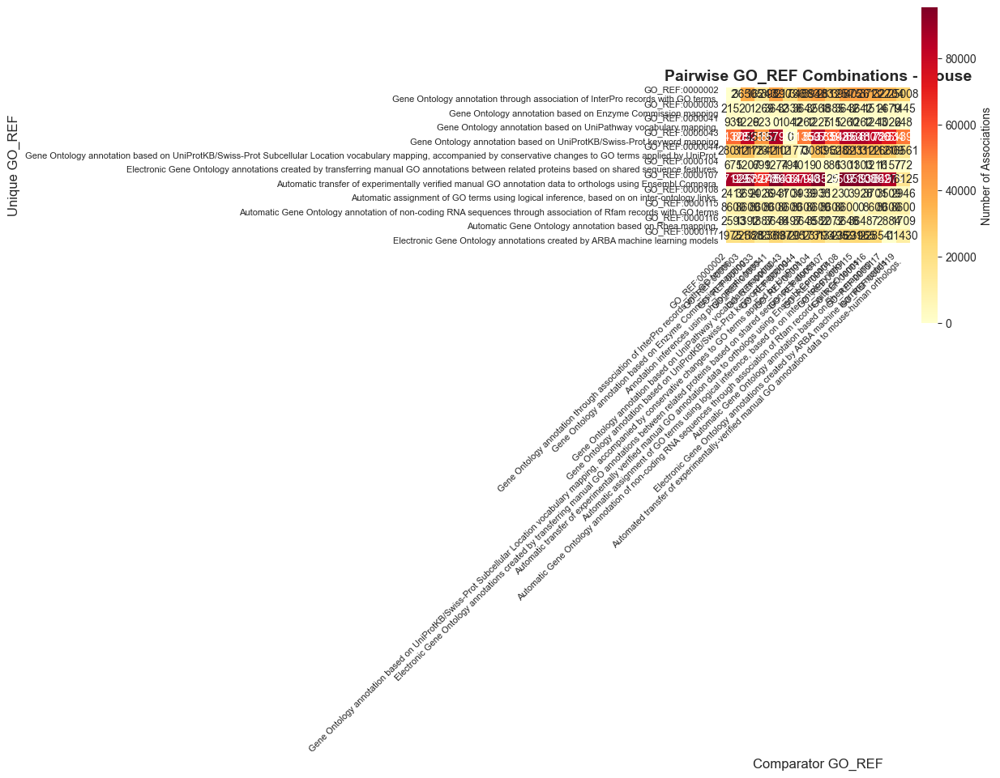

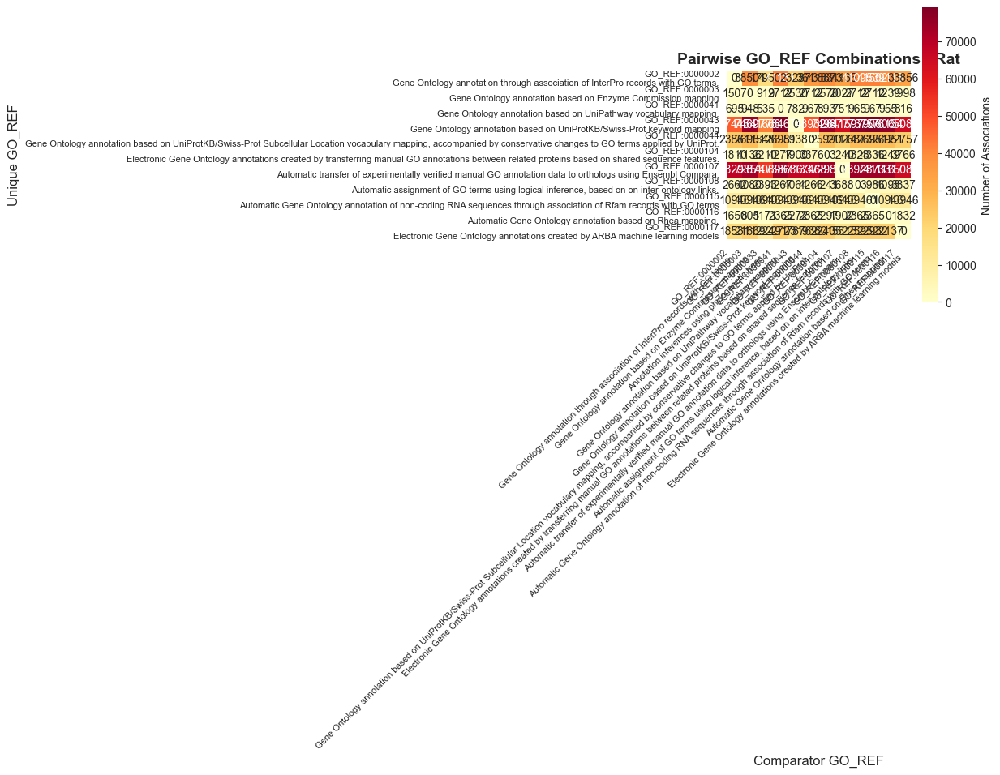

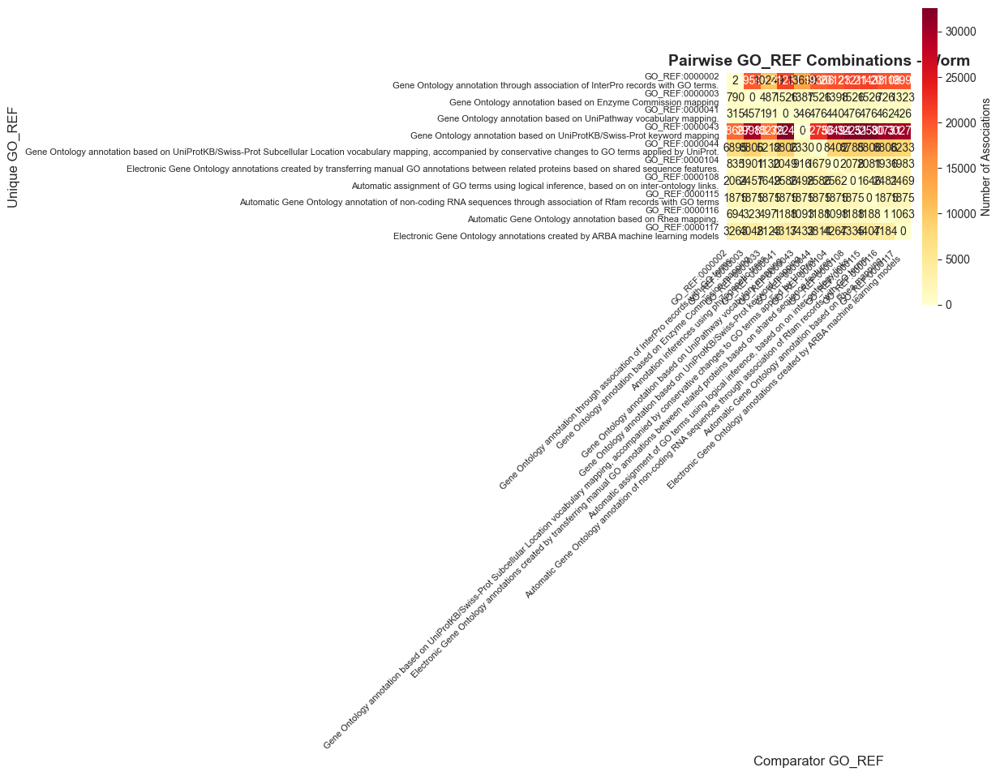

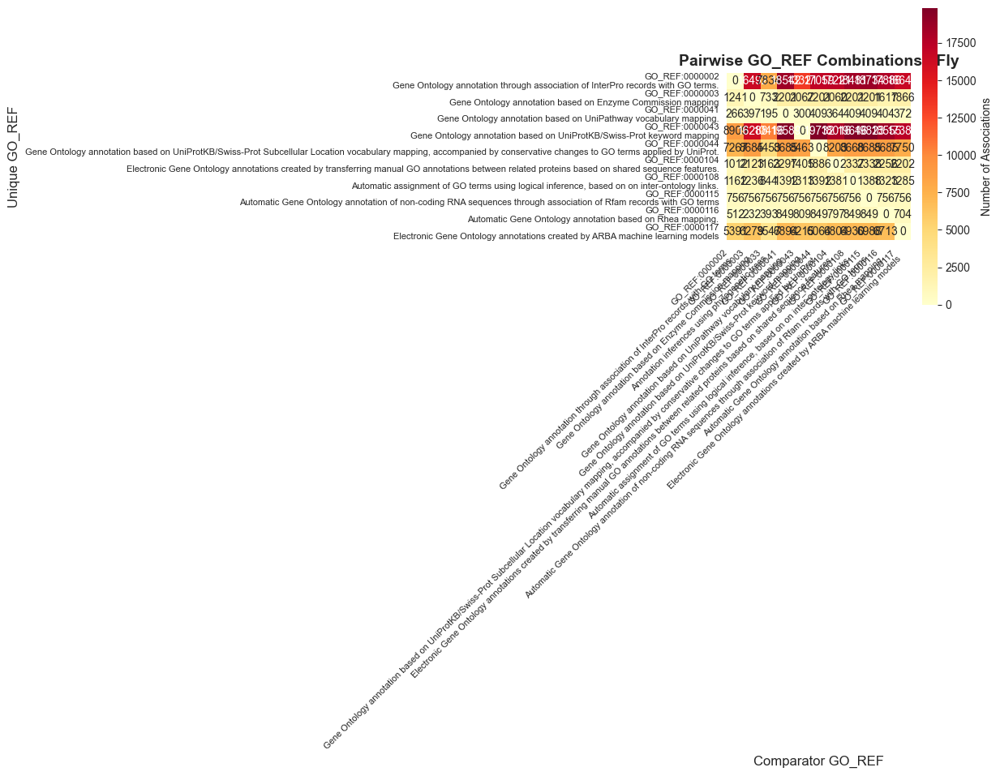

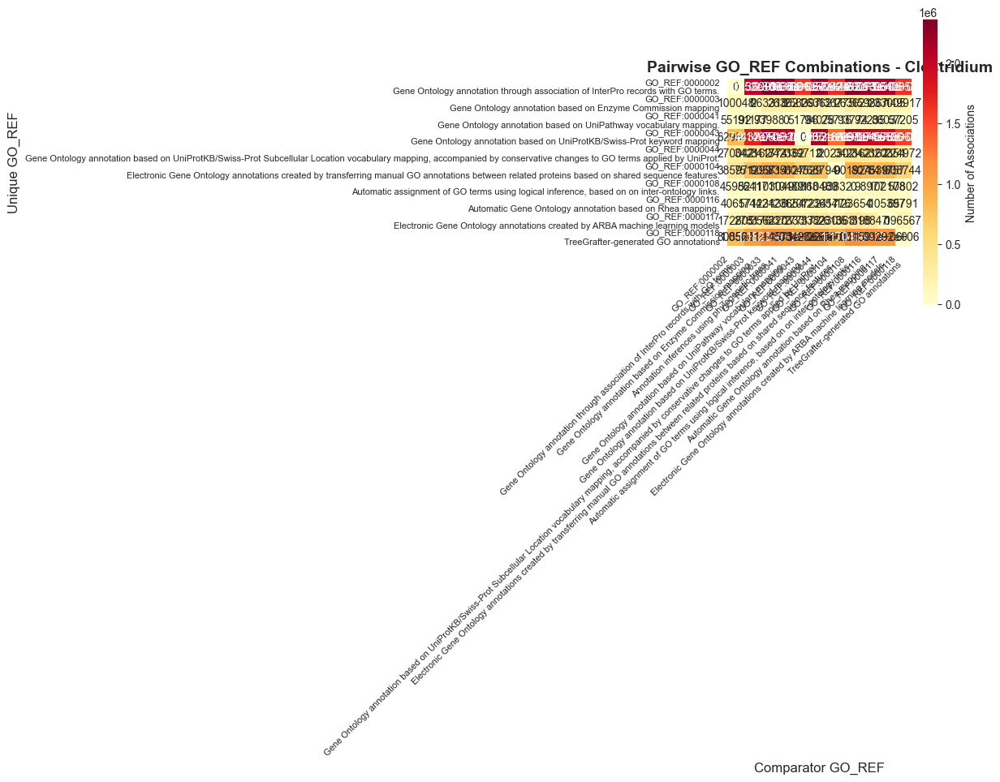

In [18]:
# Visualize pairwise GO_REF combinations as network-style heatmaps
if pairwise_data:
    for species_name, df in pairwise_data.items():
        if df.empty:
            continue
            
        # Create a pivot table for this species
        # Combine ref_id and title for better readability
        df['unique_ref'] = df['unique_ref_id'] + '\n' + df['unique_ref_title']
        df['comparator_ref'] = df['comparator_ref_id'] + '\n' + df['comparator_ref_title']
        
        # Create pivot table
        pivot = df.pivot_table(
            index='unique_ref',
            columns='comparator_ref',
            values='association_count',
            fill_value=0
        )
        
        # Create heatmap
        plt.figure(figsize=(12, 10))
        sns.heatmap(pivot, 
                    annot=True, 
                    fmt='g',
                    cmap='YlOrRd',
                    cbar_kws={'label': 'Number of Associations'},
                    square=True)
        
        plt.title(f'Pairwise GO_REF Combinations - {species_name}', 
                 fontsize=14, fontweight='bold')
        plt.xlabel('Comparator GO_REF', fontsize=12)
        plt.ylabel('Unique GO_REF', fontsize=12)
        plt.xticks(rotation=45, ha='right', fontsize=8)
        plt.yticks(rotation=0, fontsize=8)
        plt.tight_layout()
        plt.show()

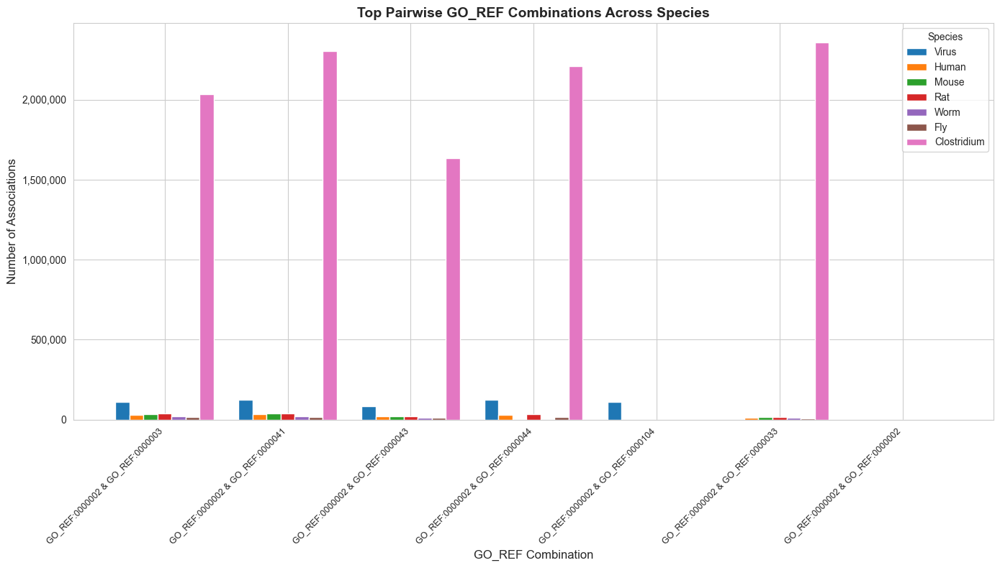

In [19]:
# Create comparative bar chart of top pairwise combinations across species
if pairwise_data:
    # Collect top N combinations from each species
    top_n = 5
    comparison_records = []
    
    for species_name, df in pairwise_data.items():
        if not df.empty:
            top_combinations = df.head(top_n)
            for _, row in top_combinations.iterrows():
                comparison_records.append({
                    'Species': species_name,
                    'Combination': f"{row['unique_ref_id']} & {row['comparator_ref_id']}",
                    'Count': row['association_count']
                })
    
    if comparison_records:
        comparison_df = pd.DataFrame(comparison_records)
        
        # Create grouped bar chart
        fig, ax = plt.subplots(figsize=(14, 8))
        
        # Group by combination and create bars for each species
        combinations = comparison_df['Combination'].unique()
        species_list = comparison_df['Species'].unique()
        
        x = np.arange(len(combinations))
        width = 0.8 / len(species_list)
        
        for i, species in enumerate(species_list):
            species_data = comparison_df[comparison_df['Species'] == species]
            values = []
            for combo in combinations:
                val = species_data[species_data['Combination'] == combo]['Count'].values
                values.append(val[0] if len(val) > 0 else 0)
            
            ax.bar(x + i * width, values, width, label=species)
        
        ax.set_xlabel('GO_REF Combination', fontsize=12)
        ax.set_ylabel('Number of Associations', fontsize=12)
        ax.set_title('Top Pairwise GO_REF Combinations Across Species', 
                    fontsize=14, fontweight='bold')
        ax.set_xticks(x + width * (len(species_list) - 1) / 2)
        ax.set_xticklabels(combinations, rotation=45, ha='right', fontsize=9)
        ax.legend(title='Species')
        ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{int(x):,}'))
        
        plt.tight_layout()
        plt.show()

In [20]:
# Export pairwise data to CSV
if pairwise_data:
    for species_name, df in pairwise_data.items():
        if not df.empty:
            # Export to CSV
            filename = export_dir / f"pairwise_goref_{species_name.lower().replace(' ', '_')}.csv"
            df.to_csv(filename, index=False)
            print(f"Exported {species_name} pairwise data to {filename}")
    
    print(f"\nAll pairwise data exported to {export_dir}/")

Exported Virus pairwise data to iea_contributions_export/pairwise_goref_virus.csv
Exported Human pairwise data to iea_contributions_export/pairwise_goref_human.csv
Exported Mouse pairwise data to iea_contributions_export/pairwise_goref_mouse.csv
Exported Rat pairwise data to iea_contributions_export/pairwise_goref_rat.csv
Exported Worm pairwise data to iea_contributions_export/pairwise_goref_worm.csv
Exported Fly pairwise data to iea_contributions_export/pairwise_goref_fly.csv
Exported Clostridium pairwise data to iea_contributions_export/pairwise_goref_clostridium.csv

All pairwise data exported to iea_contributions_export/


### Pairwise Summary Statistics

In [21]:
# Generate summary statistics for pairwise combinations
if pairwise_data:
    summary_stats = []
    
    for species_name, df in pairwise_data.items():
        if not df.empty:
            # Calculate statistics
            total_pairs = len(df)
            total_associations = df['association_count'].sum()
            avg_associations = df['association_count'].mean()
            max_associations = df['association_count'].max()
            
            # Get most common combination
            top_row = df.iloc[0]
            top_combo = f"{top_row['unique_ref_id']} & {top_row['comparator_ref_id']}"
            
            # Count unique GO_REFs involved
            unique_refs = set(df['unique_ref_id'].unique()) | set(df['comparator_ref_id'].unique())
            
            summary_stats.append({
                'Species': species_name,
                'Total Pairs': total_pairs,
                'Total Associations': f"{total_associations:,}",
                'Avg per Pair': f"{avg_associations:.1f}",
                'Max Associations': f"{max_associations:,}",
                'Top Combination': top_combo,
                'Unique GO_REFs': len(unique_refs)
            })
    
    if summary_stats:
        summary_stats_df = pd.DataFrame(summary_stats)
        print("\n" + "="*80)
        print("PAIRWISE GO_REF COMBINATION STATISTICS")
        print("="*80)
        display(summary_stats_df)


PAIRWISE GO_REF COMBINATION STATISTICS


,Species,Total Pairs,Total Associations,Avg per Pair,Max Associations,Top Combination,Unique GO_REFs
0,Virus,90,"3,371,164",37457.4,"180,521",GO_REF:0000002 & GO_REF:0000003,10
1,Human,121,"3,197,730",26427.5,"89,478",GO_REF:0000002 & GO_REF:0000003,12
2,Mouse,135,"2,998,002",22207.4,"95,308",GO_REF:0000002 & GO_REF:0000002,13
3,Rat,121,"2,602,444",21507.8,"79,060",GO_REF:0000002 & GO_REF:0000003,12
4,Worm,102,"662,710",6497.2,"32,580",GO_REF:0000002 & GO_REF:0000002,11
5,Fly,100,"539,985",5399.9,"19,823",GO_REF:0000002 & GO_REF:0000003,11
6,Clostridium,100,"67,117,582",671175.8,"2,360,086",GO_REF:0000002 & GO_REF:0000003,11


## Term-Level Unique Contributions

Specific GO terms where each pipeline provides non-redundant annotations. Shows the top terms per method to identify what biological areas each pipeline uniquely covers.

In [22]:
def get_term_level_contributions(db_path, species_name, evidence_type='IEA', top_n=20):
    """
    Query term-level unique contributions for each GO_REF method
    
    Args:
        db_path: Path to the DuckDB database file
        species_name: Name of the species/database for display
        evidence_type: Evidence type to filter (default 'IEA')
        top_n: Number of top terms to retrieve per method
    
    Returns:
        DataFrame with term-level contribution data
    """
    conn = duckdb.connect(str(db_path), read_only=True)
    
    query = f"""
    SELECT 
        evidence_type,
        supporting_references,
        id AS go_term,
        label AS go_term_label,
        association_count
    FROM gaf_unique_reference_contrib_term_l
    WHERE evidence_type = '{evidence_type}'
    ORDER BY supporting_references, association_count DESC
    """
    
    try:
        df = conn.execute(query).df()
        conn.close()
        return df
    except Exception as e:
        print(f"Error querying {species_name}: {e}")
        conn.close()
        return pd.DataFrame()

In [23]:
# Define species to analyze for term-level contributions
term_analysis_species = {
    'Human': available_dbs.get('Human GOA'),
    'Mouse': available_dbs.get('Mouse MGI'),
    'Fly': available_dbs.get('Fly'),
    'Worm': available_dbs.get('Worm'),
    'Yeast': available_dbs.get('Yeast'),
    'Plant': available_dbs.get('Plant'),
    'Clostridium': available_dbs.get('Clostridium'),
    'Virus': available_dbs.get('Virus'),
    'Fungi': available_dbs.get('Fungi'),
    'Archaea': available_dbs.get('Archaea'),
}

# Remove None values
term_analysis_species = {k: v for k, v in term_analysis_species.items() if v is not None}

print("Analyzing term-level contributions for:")
for species in term_analysis_species.keys():
    print(f"  - {species}")

Analyzing term-level contributions for:
  - Human
  - Mouse
  - Fly
  - Worm
  - Yeast
  - Clostridium
  - Virus
  - Fungi
  - Archaea


In [24]:
# Collect term-level data for each species
term_level_data = {}

for species_name, db_path in term_analysis_species.items():
    print(f"\nAnalyzing {species_name}...")
    df = get_term_level_contributions(db_path, species_name)
    
    if not df.empty:
        term_level_data[species_name] = df
        print(f"  Found {len(df)} term-method combinations")
        print(f"  Unique GO_REFs: {df['supporting_references'].nunique()}")
        print(f"  Unique GO terms: {df['go_term'].nunique()}")
        print(f"  Total associations: {df['association_count'].sum():,}")
    else:
        print(f"  No term-level data available")


Analyzing Human...
Error querying Human: Catalog Error: Table with name gaf_unique_reference_contrib_term_l does not exist!
Did you mean "gaf_unique_reference_contrib"?

LINE 8:     FROM gaf_unique_reference_contrib_term_l
                 ^
  No term-level data available

Analyzing Mouse...
Error querying Mouse: Catalog Error: Table with name gaf_unique_reference_contrib_term_l does not exist!
Did you mean "gaf_unique_reference_contrib"?

LINE 8:     FROM gaf_unique_reference_contrib_term_l
                 ^
  No term-level data available

Analyzing Fly...
  Found 1636 term-method combinations
  Unique GO_REFs: 10
  Unique GO terms: 1387
  Total associations: 11,753

Analyzing Worm...
Error querying Worm: Catalog Error: Table with name gaf_unique_reference_contrib_term_l does not exist!
Did you mean "gaf_unique_reference_contrib"?

LINE 8:     FROM gaf_unique_reference_contrib_term_l
                 ^
  No term-level data available

Analyzing Yeast...
  Found 840 term-method combin

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

  Found 15923 term-method combinations
  Unique GO_REFs: 11
  Unique GO terms: 8898
  Total associations: 21,764,007

Analyzing Archaea...
  Found 4818 term-method combinations
  Unique GO_REFs: 10
  Unique GO terms: 3468
  Total associations: 799,994


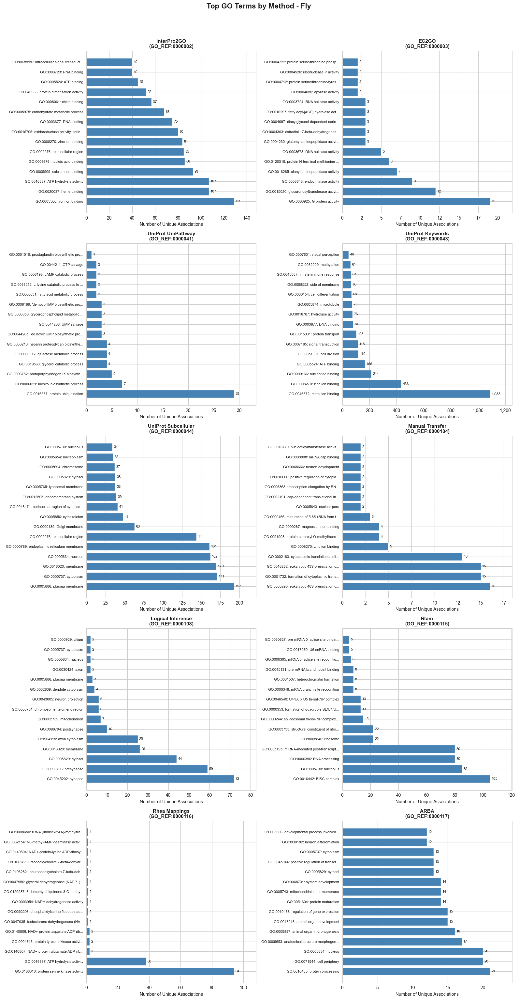

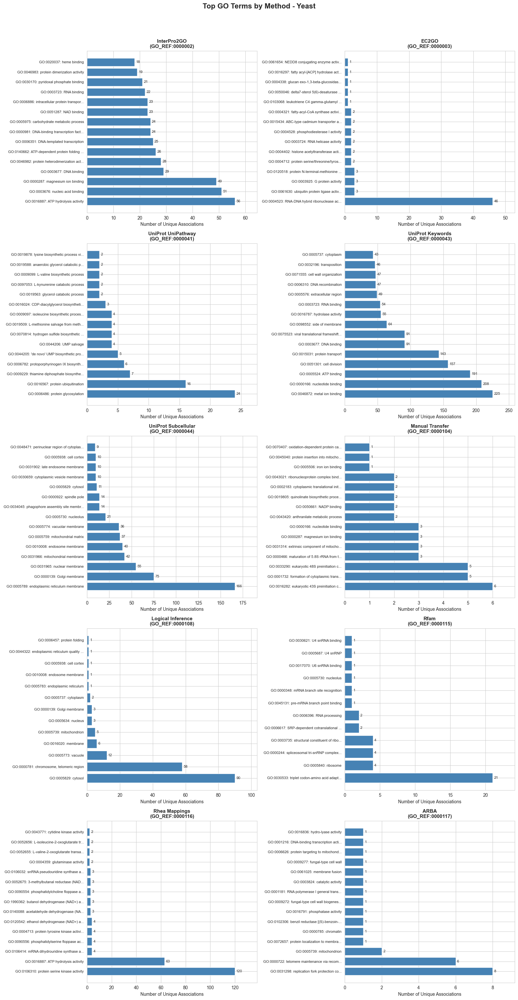

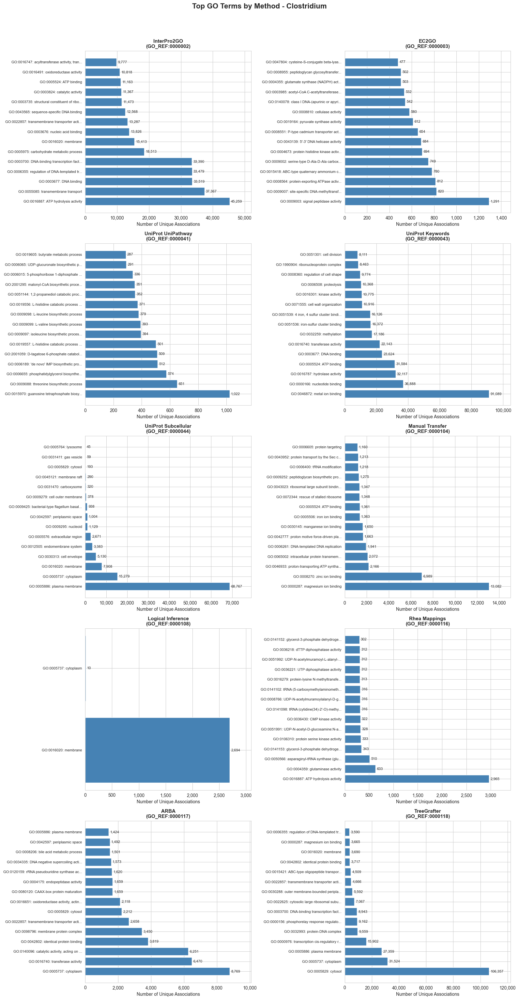

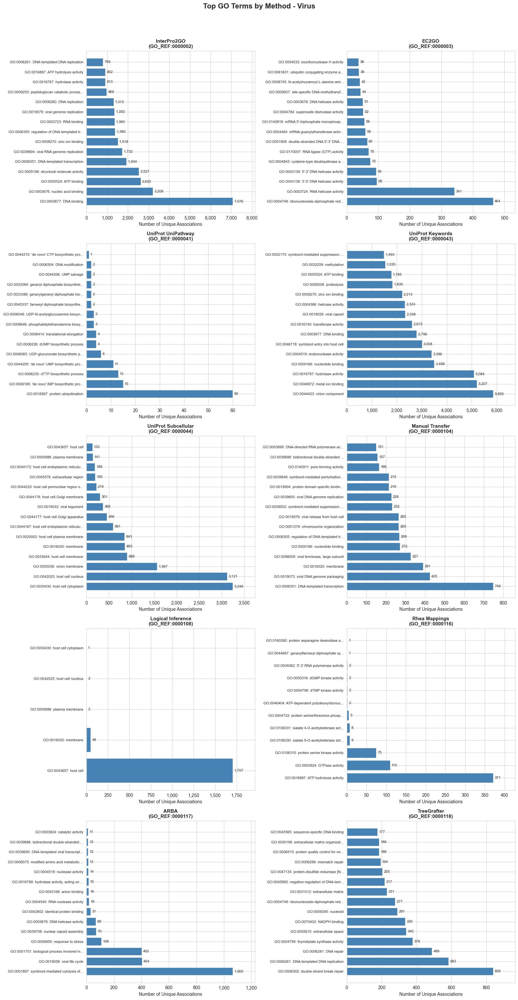

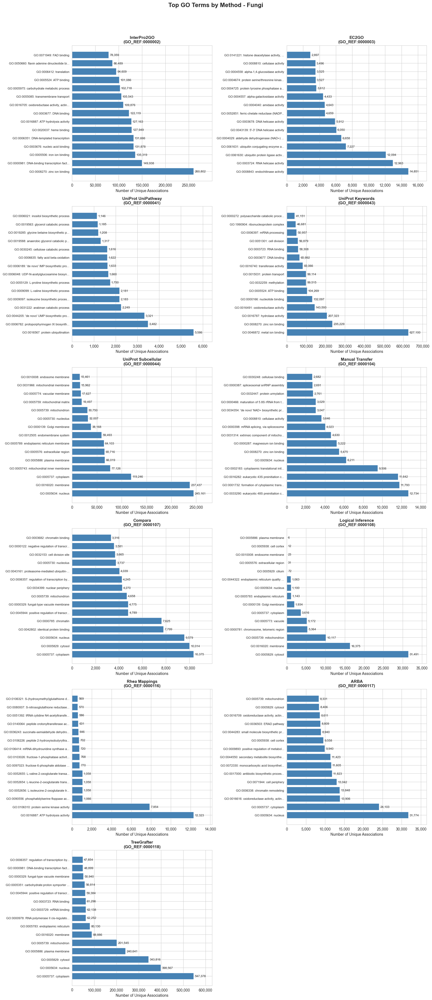

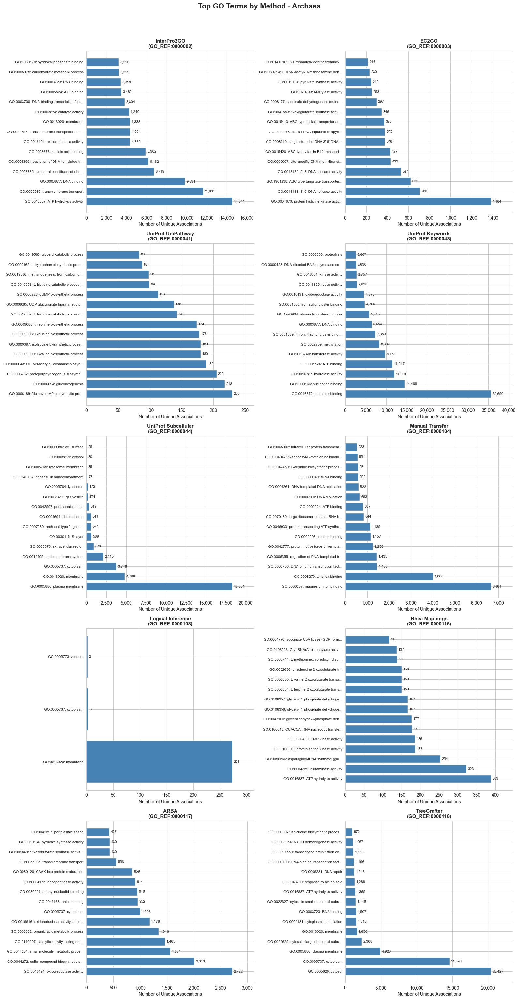

In [25]:
# Create bar charts showing top terms per method, by species
if term_level_data:
    for species_name, df in term_level_data.items():
        if df.empty:
            continue
        
        # Get unique GO_REFs that are in our dictionary
        go_refs_in_data = df['supporting_references'].unique()
        go_refs_to_plot = [ref for ref in go_refs_in_data if ref in GO_REF_NAMES]
        
        if not go_refs_to_plot:
            print(f"No known GO_REFs found in term-level data for {species_name}")
            continue
        
        # Determine grid layout
        n_refs = len(go_refs_to_plot)
        n_cols = min(2, n_refs)
        n_rows = (n_refs + n_cols - 1) // n_cols
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(8*n_cols, 6*n_rows))
        
        # Handle single plot case
        if n_refs == 1:
            axes = [axes]
        elif n_rows == 1 and n_cols > 1:
            axes = axes.flatten()
        elif n_rows > 1:
            axes = axes.flatten()
        
        for idx, ref in enumerate(go_refs_to_plot):
            ax = axes[idx]
            
            # Get top terms for this GO_REF
            ref_data = df[df['supporting_references'] == ref].head(15)
            
            if not ref_data.empty:
                # Create bar chart
                y_pos = np.arange(len(ref_data))
                bars = ax.barh(y_pos, ref_data['association_count'], color='steelblue')
                
                # Add term labels (truncate if too long)
                labels = [f"{row['go_term']}: {row['go_term_label'][:30]}..." 
                         if len(row['go_term_label']) > 30 
                         else f"{row['go_term']}: {row['go_term_label']}"
                         for _, row in ref_data.iterrows()]
                
                ax.set_yticks(y_pos)
                ax.set_yticklabels(labels, fontsize=8)
                ax.set_xlabel('Number of Unique Associations', fontsize=10)
                ax.set_title(f'{GO_REF_NAMES.get(ref, ref)}\n({ref})', 
                           fontsize=11, fontweight='bold')
                
                # Add value labels on bars
                for bar, val in zip(bars, ref_data['association_count']):
                    width = bar.get_width()
                    ax.text(width + max(ref_data['association_count'])*0.01, 
                           bar.get_y() + bar.get_height()/2,
                           f'{val:,}', 
                           ha='left', va='center', fontsize=8)
                
                # Format x-axis
                ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{int(x):,}'))
                ax.set_xlim(0, max(ref_data['association_count']) * 1.15)
            else:
                ax.text(0.5, 0.5, 'No data', ha='center', va='center', 
                       transform=ax.transAxes)
                ax.set_title(f'{GO_REF_NAMES.get(ref, ref)}', 
                           fontsize=11, fontweight='bold')
        
        # Hide empty subplots
        for idx in range(n_refs, len(axes)):
            axes[idx].axis('off')
        
        plt.suptitle(f'Top GO Terms by Method - {species_name}', 
                    fontsize=16, fontweight='bold', y=1.02)
        plt.tight_layout()
        plt.show()

### Term-Level Summary Statistics

In [26]:
# Generate summary statistics for term-level contributions
if term_level_data:
    term_summary_stats = []
    
    for species_name, df in term_level_data.items():
        if not df.empty:
            # Get statistics per GO_REF
            for ref in df['supporting_references'].unique():
                if ref in GO_REF_NAMES:
                    ref_data = df[df['supporting_references'] == ref]
                    
                    # Get most contributed term
                    top_term = ref_data.iloc[0] if not ref_data.empty else None
                    
                    term_summary_stats.append({
                        'Species': species_name,
                        'Method': GO_REF_NAMES.get(ref, ref),
                        'GO_REF': ref,
                        'Unique Terms': ref_data['go_term'].nunique(),
                        'Total Associations': f"{ref_data['association_count'].sum():,}",
                        'Avg per Term': f"{ref_data['association_count'].mean():.1f}",
                        'Top Term': f"{top_term['go_term']} ({top_term['go_term_label'][:40]}...)" 
                                   if top_term is not None and len(top_term['go_term_label']) > 40
                                   else f"{top_term['go_term']} ({top_term['go_term_label']})"
                                   if top_term is not None else 'N/A',
                        'Top Term Count': f"{top_term['association_count']:,}" if top_term is not None else 'N/A'
                    })
    
    if term_summary_stats:
        term_summary_df = pd.DataFrame(term_summary_stats)
        term_summary_df = term_summary_df.sort_values(['Species', 'Method'])
        
        print("\n" + "="*100)
        print("TERM-LEVEL UNIQUE CONTRIBUTION STATISTICS BY METHOD AND SPECIES")
        print("="*100)
        display(term_summary_df)


TERM-LEVEL UNIQUE CONTRIBUTION STATISTICS BY METHOD AND SPECIES


,Species,Method,GO_REF,Unique Terms,Total Associations,Avg per Term,Top Term,Top Term Count
59,Archaea,ARBA,GO_REF:0000117,215,"30,165",140.3,GO:0016491 (oxidoreductase activity),"2,722"
52,Archaea,EC2GO,GO_REF:0000003,1054,"20,981",19.9,GO:0004673 (protein histidine kinase activity),"1,384"
51,Archaea,InterPro2GO,GO_REF:0000002,1364,"281,452",206.3,GO:0016887 (ATP hydrolysis activity),"14,541"
57,Archaea,Logical Inference,GO_REF:0000108,3,278,92.7,GO:0016020 (membrane),273
56,Archaea,Manual Transfer,GO_REF:0000104,219,"43,749",199.8,GO:0000287 (magnesium ion binding),"6,661"
...,...,...,...,...,...,...,...,...
17,Yeast,Rfam,GO_REF:0000115,12,43,3.6,GO:0030533 (triplet codon-amino acid adaptor a...,21
18,Yeast,Rhea Mappings,GO_REF:0000116,77,297,3.9,GO:0106310 (protein serine kinase activity),120
13,Yeast,UniProt Keywords,GO_REF:0000043,177,"2,470",14.0,GO:0046872 (metal ion binding),225
14,Yeast,UniProt Subcellular,GO_REF:0000044,57,680,11.9,GO:0005789 (endoplasmic reticulum membrane),166


## GO Term Enrichment Analysis

Statistical enrichment analysis identifying GO terms significantly over-represented in each pipeline's annotations compared to the overall IEA background.

In [27]:
!pip install statsmodels


[notice] A new release of pip is available: 23.0.1 -> 25.3
[notice] To update, run: pip install --upgrade pip


In [28]:
from scipy import stats
from statsmodels.stats.multitest import multipletests

def get_all_term_annotations(db_path, evidence_type='IEA'):
    """
    Get all term annotations for background calculation
    """
    conn = duckdb.connect(str(db_path), read_only=True)
    
    query = f"""
    SELECT 
        ontology_class_ref AS go_term,
        term_label.label AS go_term_label,
        supporting_references,
        COUNT(*) as annotation_count
    FROM gaf_association_flat
     INNER JOIN term_label ON gaf_association_flat.ontology_class_ref = term_label.id
    WHERE evidence_type = '{evidence_type}'
    GROUP BY go_term, go_term_label, supporting_references
    """
    
    try:
        df = conn.execute(query).df()
        conn.close()
        return df
    except Exception as e:
        print(f"Error querying: {e}")
        conn.close()
        return pd.DataFrame()

In [29]:
def calculate_enrichment(all_annotations_df, method_ref, p_cutoff=0.05):
    """
    Calculate enrichment for GO terms for a specific method using hypergeometric test
    
    Args:
        all_annotations_df: DataFrame with all annotations
        method_ref: The GO_REF to test for enrichment
        p_cutoff: P-value cutoff after FDR correction
    
    Returns:
        DataFrame with enrichment results
    """
    # Get method-specific annotations
    method_annotations = all_annotations_df[all_annotations_df['supporting_references'] == method_ref].copy()
    
    if method_annotations.empty:
        return pd.DataFrame()
    
    # Calculate totals
    total_annotations = all_annotations_df['annotation_count'].sum()
    method_total = method_annotations['annotation_count'].sum()
    
    # Get all unique terms
    all_terms = all_annotations_df.groupby(['go_term', 'go_term_label'])['annotation_count'].sum().reset_index()
    
    enrichment_results = []
    
    for _, term_row in all_terms.iterrows():
        term = term_row['go_term']
        term_label = term_row['go_term_label']
        term_total = term_row['annotation_count']
        
        # Get method-specific count for this term
        method_term_data = method_annotations[method_annotations['go_term'] == term]
        method_term_count = method_term_data['annotation_count'].sum() if not method_term_data.empty else 0
        
        if method_term_count == 0:
            continue
        
        # Hypergeometric test
        # M = total population (all annotations)
        # n = success states in population (annotations with this term)
        # N = number of draws (method annotations)
        # k = observed successes (method annotations with this term)
        
        # Calculate p-value for enrichment (over-representation)
        p_value = stats.hypergeom.sf(method_term_count - 1, total_annotations, term_total, method_total)
        
        # Calculate fold enrichment
        expected = (method_total * term_total) / total_annotations
        fold_enrichment = method_term_count / expected if expected > 0 else 0
        
        enrichment_results.append({
            'go_term': term,
            'go_term_label': term_label,
            'method_count': method_term_count,
            'method_total': method_total,
            'term_total': term_total,
            'total_annotations': total_annotations,
            'fold_enrichment': fold_enrichment,
            'p_value': p_value
        })
    
    if not enrichment_results:
        return pd.DataFrame()
    
    results_df = pd.DataFrame(enrichment_results)
    
    # Apply FDR correction
    if len(results_df) > 0:
        _, p_adjusted, _, _ = multipletests(results_df['p_value'], method='fdr_bh')
        results_df['p_adjusted'] = p_adjusted
        
        # Filter by adjusted p-value
        results_df = results_df[results_df['p_adjusted'] < p_cutoff]
        
        # Sort by fold enrichment
        results_df = results_df.sort_values('fold_enrichment', ascending=False)
    
    return results_df

In [30]:
# Perform enrichment analysis for selected species
enrichment_species = {
    'Human': available_dbs.get('Human GOA'),
    'Mouse': available_dbs.get('Mouse MGI'),
    'Yeast': available_dbs.get('Yeast'),
    'Fly': available_dbs.get('Fly'),
    'Worm': available_dbs.get('Worm'),
    'Plant': available_dbs.get('Plant'),
    'Clostridium': available_dbs.get('Clostridium'),
    'Virus': available_dbs.get('Virus'),
    'Fungi': available_dbs.get('Fungi'),
    'Archaea': available_dbs.get('Archaea'),
}

# Remove None values
enrichment_species = {k: v for k, v in enrichment_species.items() if v is not None}

enrichment_results = {}

for species_name, db_path in enrichment_species.items():
    print(f"\nPerforming enrichment analysis for {species_name}...")
    
    # Get all annotations for background
    all_annotations = get_all_term_annotations(db_path)
    
    if all_annotations.empty:
        print(f"  No annotation data available for {species_name}")
        continue
    
    species_enrichments = {}
    
    # Test each GO_REF method
    go_refs_to_test = [ref for ref in all_annotations['supporting_references'].unique() 
                       if ref in GO_REF_NAMES]
    
    print(f"  Testing {len(go_refs_to_test)} methods...")
    
    for ref in go_refs_to_test:
        enriched_terms = calculate_enrichment(all_annotations, ref, p_cutoff=0.01)
        
        if not enriched_terms.empty:
            species_enrichments[ref] = enriched_terms
            print(f"    {GO_REF_NAMES[ref]}: {len(enriched_terms)} enriched terms")
        else:
            print(f"    {GO_REF_NAMES[ref]}: No significantly enriched terms")
    
    if species_enrichments:
        enrichment_results[species_name] = species_enrichments


Performing enrichment analysis for Human...
  Testing 11 methods...
    Compara: 2534 enriched terms
    InterPro2GO: 624 enriched terms
    ARBA: 694 enriched terms
    Rfam: 56 enriched terms
    EC2GO: 457 enriched terms
    UniProt Subcellular: 171 enriched terms
    UniProt UniPathway: 128 enriched terms
    Rhea Mappings: 544 enriched terms
    Logical Inference: 184 enriched terms
    UniProt Keywords: 256 enriched terms
    Manual Transfer: 136 enriched terms

Performing enrichment analysis for Mouse...
  Testing 11 methods...
    Compara: 1702 enriched terms
    ARBA: 552 enriched terms
    InterPro2GO: 432 enriched terms
    UniProt Keywords: 227 enriched terms
    Logical Inference: 179 enriched terms
    Rhea Mappings: 473 enriched terms
    EC2GO: 395 enriched terms
    Manual Transfer: 98 enriched terms
    Rfam: 40 enriched terms
    UniProt Subcellular: 172 enriched terms
    UniProt UniPathway: 119 enriched terms

Performing enrichment analysis for Yeast...
  Testing 

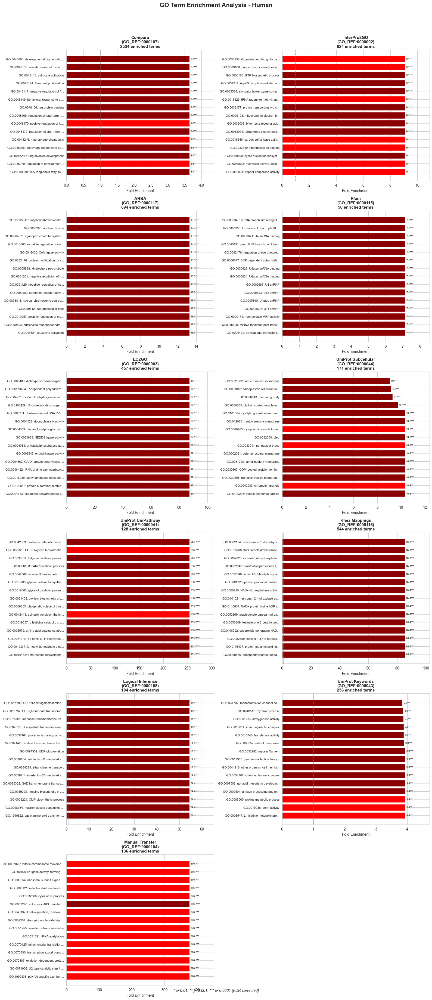

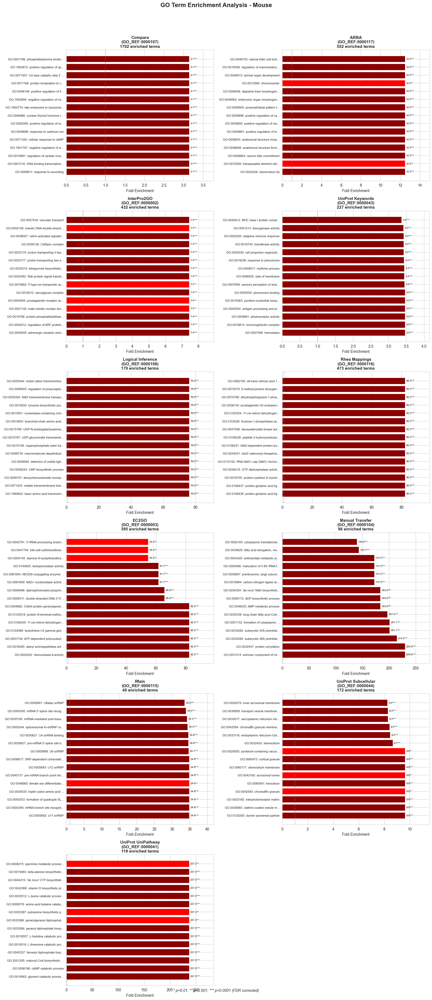

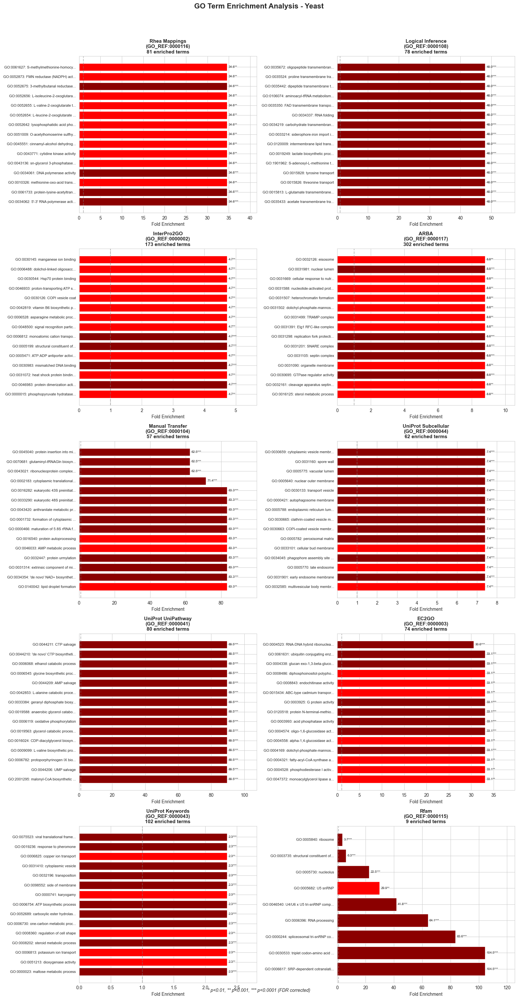

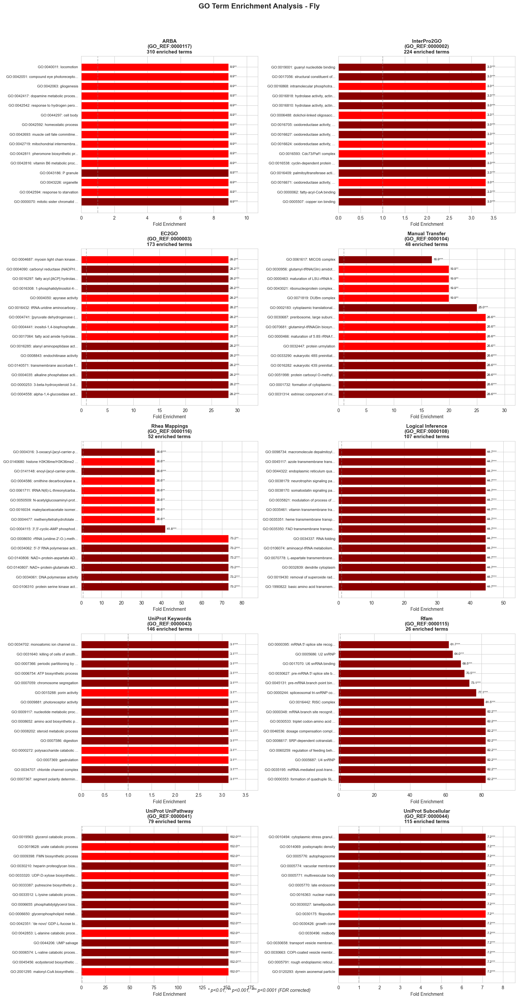

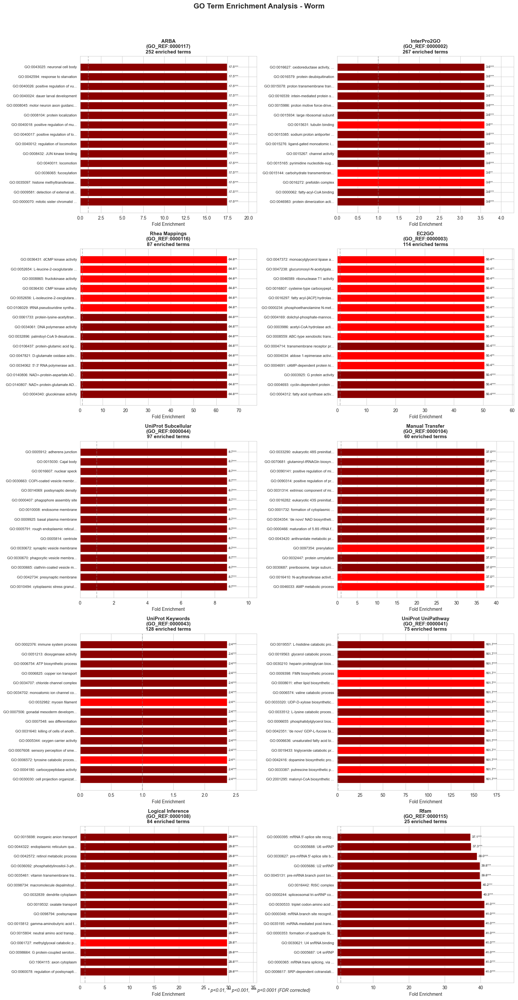

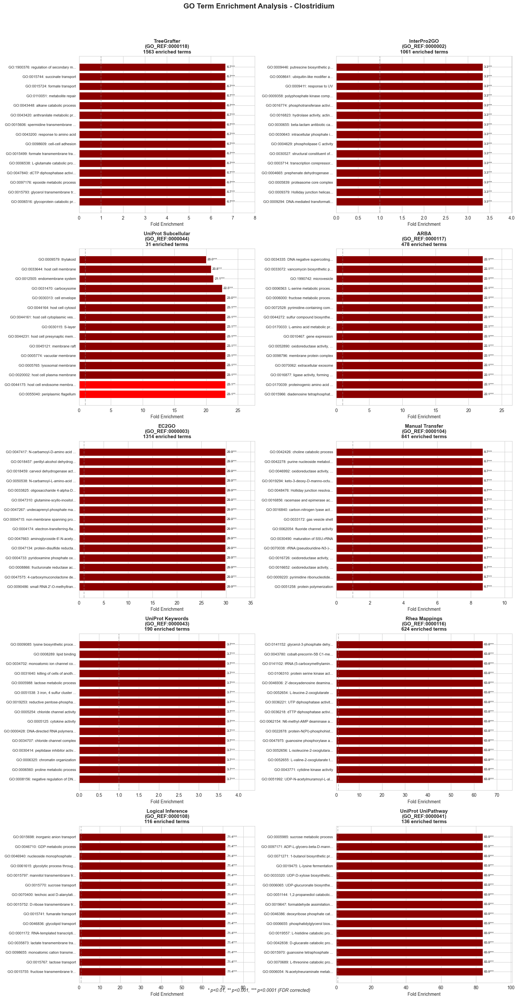

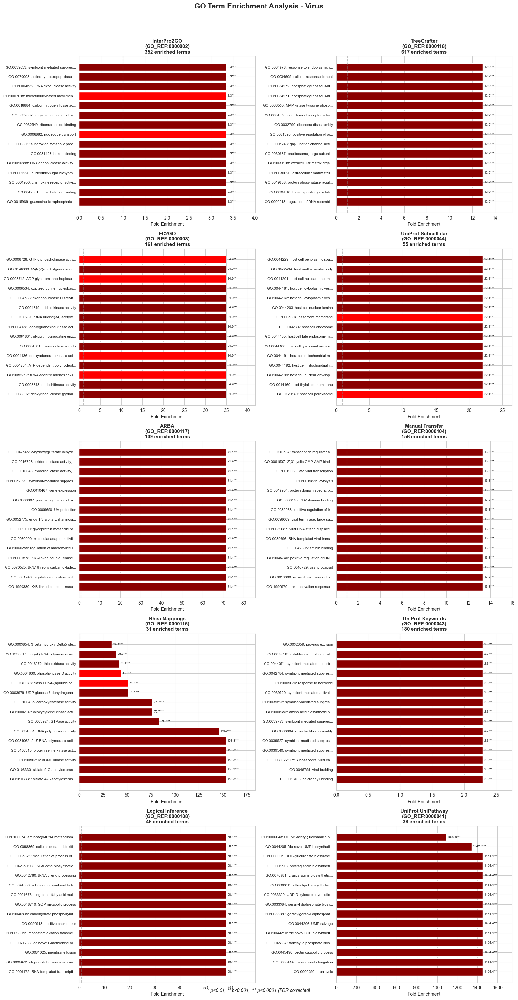

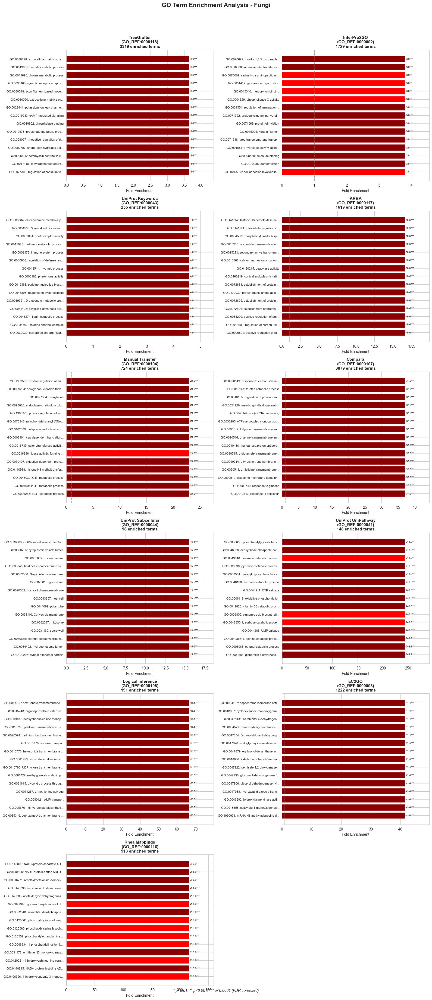

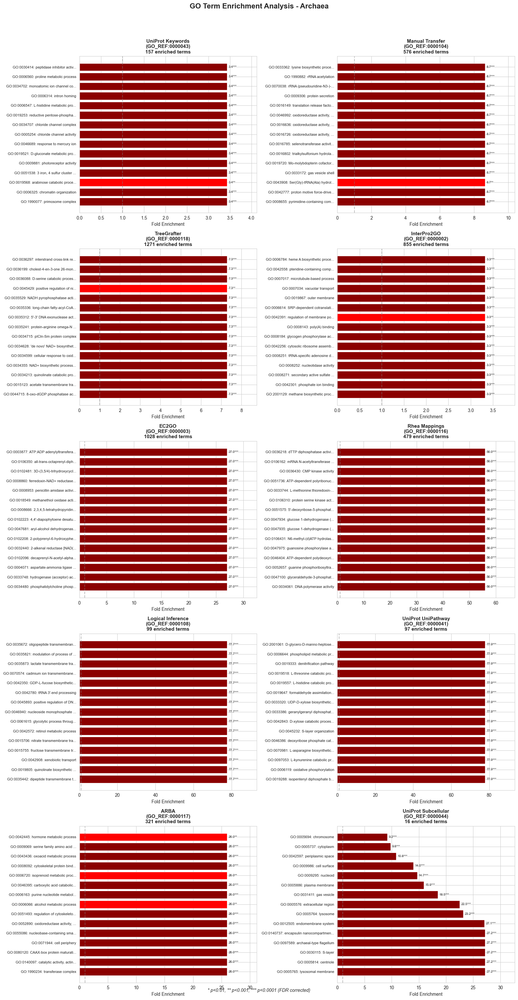

In [31]:
# Visualize top enriched terms for each method/species
if enrichment_results:
    for species_name, species_data in enrichment_results.items():
        if not species_data:
            print(f"No enrichment results for {species_name}")
            continue
        
        # Get methods with enriched terms
        methods_with_enrichment = list(species_data.keys())
        
        if not methods_with_enrichment:
            print(f"No enriched terms for any method in {species_name}")
            continue
        
        # Determine grid layout
        n_methods = len(methods_with_enrichment)
        n_cols = min(2, n_methods)
        n_rows = (n_methods + n_cols - 1) // n_cols
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(8*n_cols, 6*n_rows))
        
        # Handle single plot case
        if n_methods == 1:
            axes = [axes]
        elif n_rows == 1 and n_cols > 1:
            axes = axes.flatten()
        elif n_rows > 1:
            axes = axes.flatten()
        
        for idx, ref in enumerate(methods_with_enrichment):
            ax = axes[idx]
            enriched_df = species_data[ref].head(15)  # Top 15 enriched terms
            
            if not enriched_df.empty:
                # Create bar chart with fold enrichment
                y_pos = np.arange(len(enriched_df))
                bars = ax.barh(y_pos, enriched_df['fold_enrichment'], 
                             color=['darkred' if p < 0.001 else 'red' if p < 0.01 else 'orange' 
                                   for p in enriched_df['p_adjusted']])
                
                # Add term labels
                labels = [f"{row['go_term']}: {row['go_term_label'][:25]}..." 
                         if len(row['go_term_label']) > 25 
                         else f"{row['go_term']}: {row['go_term_label']}"
                         for _, row in enriched_df.iterrows()]
                
                ax.set_yticks(y_pos)
                ax.set_yticklabels(labels, fontsize=8)
                ax.set_xlabel('Fold Enrichment', fontsize=10)
                ax.set_title(f'{GO_REF_NAMES.get(ref, ref)}\n({ref})\n{len(species_data[ref])} enriched terms', 
                           fontsize=11, fontweight='bold')
                
                # Add value labels and significance markers
                for bar, fold, p_val in zip(bars, enriched_df['fold_enrichment'], 
                                           enriched_df['p_adjusted']):
                    width = bar.get_width()
                    sig_marker = '***' if p_val < 0.001 else '**' if p_val < 0.01 else '*'
                    ax.text(width + max(enriched_df['fold_enrichment'])*0.01, 
                           bar.get_y() + bar.get_height()/2,
                           f'{fold:.1f}{sig_marker}', 
                           ha='left', va='center', fontsize=7)
                
                # Add vertical line at fold enrichment = 1
                ax.axvline(x=1, color='gray', linestyle='--', alpha=0.5)
                ax.set_xlim(0, max(enriched_df['fold_enrichment']) * 1.2)
            else:
                ax.text(0.5, 0.5, 'No enriched terms', ha='center', va='center', 
                       transform=ax.transAxes)
                ax.set_title(f'{GO_REF_NAMES.get(ref, ref)}', 
                           fontsize=11, fontweight='bold')
        
        # Hide empty subplots
        for idx in range(n_methods, len(axes)):
            axes[idx].axis('off')
        
        # Add legend for significance markers
        fig.text(0.5, 0.01, '* p<0.01, ** p<0.001, *** p<0.0001 (FDR corrected)', 
                ha='center', fontsize=10, style='italic')
        
        plt.suptitle(f'GO Term Enrichment Analysis - {species_name}', 
                    fontsize=16, fontweight='bold', y=1.02)
        plt.tight_layout()
        plt.show()

In [32]:
# Create summary of enrichment analysis
if enrichment_results:
    enrichment_summary = []
    
    for species_name, species_data in enrichment_results.items():
        for ref, enriched_df in species_data.items():
            if not enriched_df.empty:
                top_term = enriched_df.iloc[0]
                
                enrichment_summary.append({
                    'Species': species_name,
                    'Method': GO_REF_NAMES.get(ref, ref),
                    'GO_REF': ref,
                    'Enriched Terms': len(enriched_df),
                    'Top Term': f"{top_term['go_term']} ({top_term['go_term_label'][:30]}...)" 
                               if len(top_term['go_term_label']) > 30
                               else f"{top_term['go_term']} ({top_term['go_term_label']})",
                    'Top Fold Enrichment': f"{top_term['fold_enrichment']:.2f}",
                    'Top P-adjusted': f"{top_term['p_adjusted']:.2e}",
                    'Avg Fold Enrichment': f"{enriched_df['fold_enrichment'].mean():.2f}"
                })
    
    if enrichment_summary:
        enrichment_summary_df = pd.DataFrame(enrichment_summary)
        enrichment_summary_df = enrichment_summary_df.sort_values(['Species', 'Enriched Terms'], 
                                                                  ascending=[True, False])
        
        print("\n" + "="*100)
        print("ENRICHMENT ANALYSIS SUMMARY")
        print("="*100)
        display(enrichment_summary_df)


ENRICHMENT ANALYSIS SUMMARY


,Species,Method,GO_REF,Enriched Terms,Top Term,Top Fold Enrichment,Top P-adjusted,Avg Fold Enrichment
85,Archaea,TreeGrafter,GO_REF:0000118,1271,GO:0044715 (8-oxo-dGDP phosphatase activit...),7.29,1.70e-06,5.18
87,Archaea,EC2GO,GO_REF:0000003,1028,GO:0034480 (phosphatidylcholine phospholip...),27.05,1.19e-07,16.03
86,Archaea,InterPro2GO,GO_REF:0000002,855,GO:2001129 (methane biosynthetic process f...),3.33,1.39e-07,2.53
84,Archaea,Manual Transfer,GO_REF:0000104,576,GO:0008655 (pyrimidine-containing compound...),8.65,8.82e-106,3.17
88,Archaea,Rhea Mappings,GO_REF:0000116,479,GO:0034061 (DNA polymerase activity),55.99,0.00e+00,15.57
...,...,...,...,...,...,...,...,...
23,Yeast,Logical Inference,GO_REF:0000108,78,GO:0035433 (acetate transmembrane transpor...),48.04,2.11e-05,41.50
29,Yeast,EC2GO,GO_REF:0000003,74,GO:0047372 (monoacylglycerol lipase activi...),33.13,8.71e-03,18.92
27,Yeast,UniProt Subcellular,GO_REF:0000044,62,GO:0032585 (multivesicular body membrane),7.41,3.46e-03,5.33
26,Yeast,Manual Transfer,GO_REF:0000104,57,GO:0140042 (lipid droplet formation),83.33,1.08e-03,45.67


In [33]:
# Export enrichment results
if enrichment_results:
    for species_name, species_data in enrichment_results.items():
        for ref, enriched_df in species_data.items():
            if not enriched_df.empty:
                # Add method name for clarity
                enriched_df['method_name'] = GO_REF_NAMES.get(ref, 'Unknown')
                
                # Export to CSV
                filename = export_dir / f"enrichment_{species_name.lower()}_{ref.replace(':', '_')}.csv"
                enriched_df.to_csv(filename, index=False)
                print(f"Exported {species_name} {GO_REF_NAMES.get(ref, ref)} enrichment to {filename}")
    
    # Export summary
    if 'enrichment_summary_df' in locals():
        summary_filename = export_dir / "enrichment_summary.csv"
        enrichment_summary_df.to_csv(summary_filename, index=False)
        print(f"\nExported enrichment summary to {summary_filename}")
    
    print(f"\nAll enrichment data exported to {export_dir}/")

Exported Human Compara enrichment to iea_contributions_export/enrichment_human_GO_REF_0000107.csv
Exported Human InterPro2GO enrichment to iea_contributions_export/enrichment_human_GO_REF_0000002.csv
Exported Human ARBA enrichment to iea_contributions_export/enrichment_human_GO_REF_0000117.csv
Exported Human Rfam enrichment to iea_contributions_export/enrichment_human_GO_REF_0000115.csv
Exported Human EC2GO enrichment to iea_contributions_export/enrichment_human_GO_REF_0000003.csv
Exported Human UniProt Subcellular enrichment to iea_contributions_export/enrichment_human_GO_REF_0000044.csv
Exported Human UniProt UniPathway enrichment to iea_contributions_export/enrichment_human_GO_REF_0000041.csv
Exported Human Rhea Mappings enrichment to iea_contributions_export/enrichment_human_GO_REF_0000116.csv
Exported Human Logical Inference enrichment to iea_contributions_export/enrichment_human_GO_REF_0000108.csv
Exported Human UniProt Keywords enrichment to iea_contributions_export/enrichment_h

In [34]:
# Export term-level data to CSV
if term_level_data:
    for species_name, df in term_level_data.items():
        if not df.empty:
            # Add readable method names
            df['method_name'] = df['supporting_references'].apply(
                lambda x: GO_REF_NAMES.get(x, 'Unknown')
            )
            
            # Export to CSV
            filename = export_dir / f"term_level_{species_name.lower().replace(' ', '_')}.csv"
            df.to_csv(filename, index=False)
            print(f"Exported {species_name} term-level data to {filename}")
    
    # Export summary statistics
    if 'term_summary_df' in locals():
        summary_filename = export_dir / "term_level_summary_statistics.csv"
        term_summary_df.to_csv(summary_filename, index=False)
        print(f"\nExported term-level summary statistics to {summary_filename}")
    
    print(f"\nAll term-level data exported to {export_dir}/")

Exported Fly term-level data to iea_contributions_export/term_level_fly.csv
Exported Yeast term-level data to iea_contributions_export/term_level_yeast.csv
Exported Clostridium term-level data to iea_contributions_export/term_level_clostridium.csv
Exported Virus term-level data to iea_contributions_export/term_level_virus.csv
Exported Fungi term-level data to iea_contributions_export/term_level_fungi.csv
Exported Archaea term-level data to iea_contributions_export/term_level_archaea.csv

Exported term-level summary statistics to iea_contributions_export/term_level_summary_statistics.csv

All term-level data exported to iea_contributions_export/
